In [1]:
import os
import numpy as np
import random
import shutil
import tensorflow as tf
import matplotlib.pyplot as plt
import shutil
from sklearn.model_selection import train_test_split
import seaborn as sns
from PIL import Image
from tensorflow.keras.models import Sequential
from tensorflow.keras.layers import Conv2D, MaxPooling2D, Dropout, Flatten, Dense
from tensorflow import keras
from tensorflow.keras import layers
from tensorflow.keras.preprocessing import image_dataset_from_directory
from tensorflow.python.keras.models import Sequential
from tensorflow.keras.models import save_model
from keras.models import load_model
import cv2
from matplotlib.pyplot import figure
figure(figsize=(8, 6), dpi=80)
from tensorflow.keras.preprocessing.image import ImageDataGenerator
import matplotlib.pyplot as plotter_lib
from tensorflow.keras.optimizers import Adam
import numpy as np
import pandas as pd 
import os.path
import re
from osgeo import gdal
from osgeo import gdal_array
from osgeo import osr

<Figure size 640x480 with 0 Axes>

In [2]:
from tensorflow.keras.preprocessing.image import ImageDataGenerator

In [3]:
data_directory = './New_images'
img_height, img_width = 256, 256
batch_size = 32

train_datagen = ImageDataGenerator(
    rescale=1./255,  # normalize pixel values between 0 and 1
    validation_split=0.2  # split the data into training and validation sets
)

# Load the dataset and split into train, validation, and test sets
train_ds = train_datagen.flow_from_directory(
    data_directory,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # specify the class mode as 'categorical'
    subset='training',
    seed=123,
    follow_links=True,  # allows following symbolic links
    interpolation='bilinear',  # interpolation method for resizing
    shuffle=True  # shuffle the data for training
)

validation_ds = train_datagen.flow_from_directory(
    data_directory,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # specify the class mode as 'categorical'
    subset='validation',
    seed=123,
    follow_links=True,  # allows following symbolic links
    interpolation='bilinear'  # interpolation method for resizing
)

test_ds = train_datagen.flow_from_directory(
    data_directory,
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='categorical',  # specify the class mode as 'categorical'
    subset='validation',  # use the same validation subset for the test set
    seed=123,
    follow_links=True,  # allows following symbolic links
    interpolation='bilinear'  # interpolation method for resizing
)




Found 21290 images belonging to 4 classes.
Found 5321 images belonging to 4 classes.
Found 5321 images belonging to 4 classes.


In [5]:
save_path = 'Mymodel2.h5'

In [6]:
loaded_model = load_model(save_path)

In [7]:
loaded_model.summary()

Model: "sequential"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 resnet50 (Functional)       (None, 2048)              23587712  
                                                                 
 flatten (Flatten)           (None, 2048)              0         
                                                                 
 dense (Dense)               (None, 512)               1049088   
                                                                 
 dense_1 (Dense)             (None, 4)                 2052      
                                                                 
Total params: 24,638,852
Trainable params: 24,585,732
Non-trainable params: 53,120
_________________________________________________________________


In [8]:
class_names = list(train_ds.class_indices.keys())
print(class_names)

['Dense_Forest', 'Settlement', 'Vegetation', 'Water_body']


In [9]:
image_batch, label_batch = next(iter(train_ds))

In [10]:
print(image_batch.shape)

(32, 256, 256, 3)


In [11]:
print(label_batch.shape)

(32, 4)


In [12]:
import numpy as np

first_image = (image_batch[0] * 255).astype("uint8")
print(np.min(first_image), np.max(first_image))


0 86


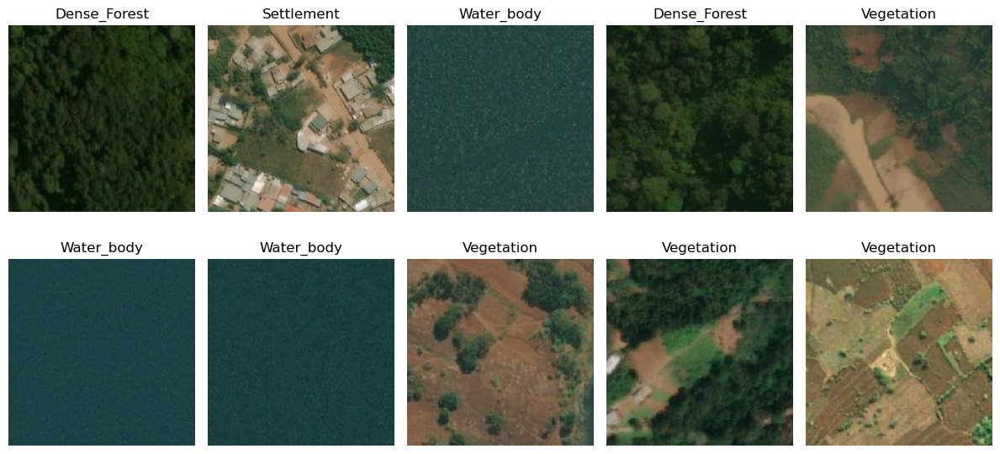

In [13]:
plt.figure(figsize=(12, 6))
for i in range(10):
    ax = plt.subplot(2, 5, i + 1)
    image = (image_batch[i] * 255).astype("uint8")
    plt.imshow(image)
    plt.title(class_names[np.argmax(label_batch[i])])
    plt.axis("off")
plt.tight_layout()
plt.show()

1/1 [==============================] - 10s 10s/step


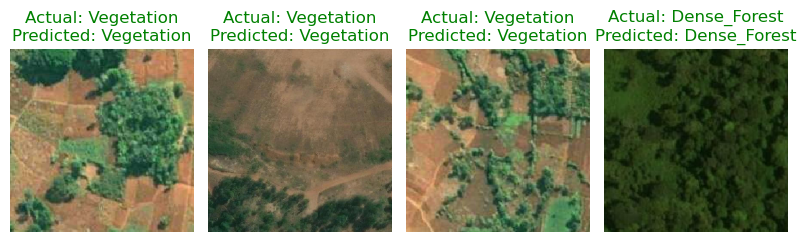

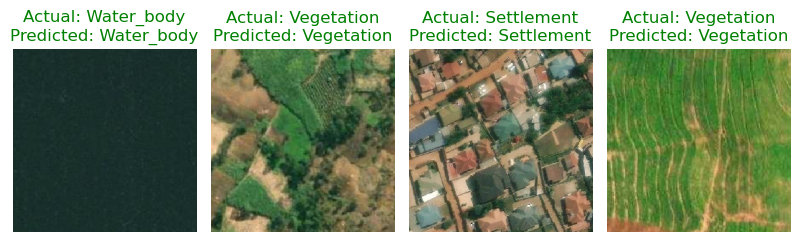

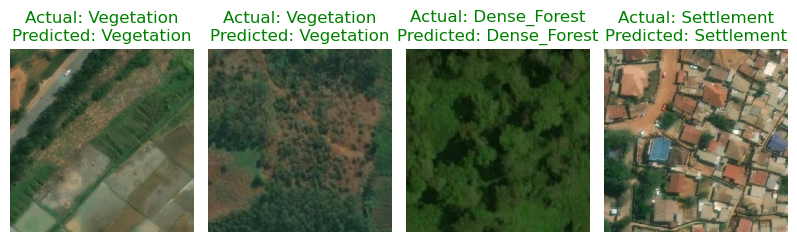

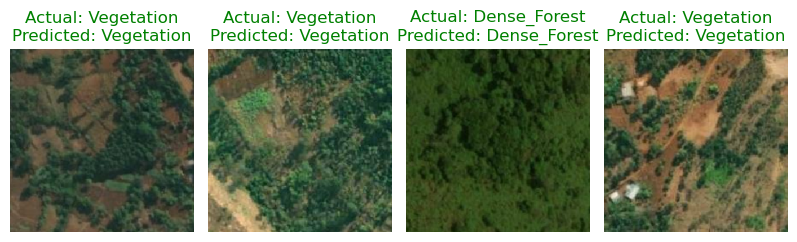

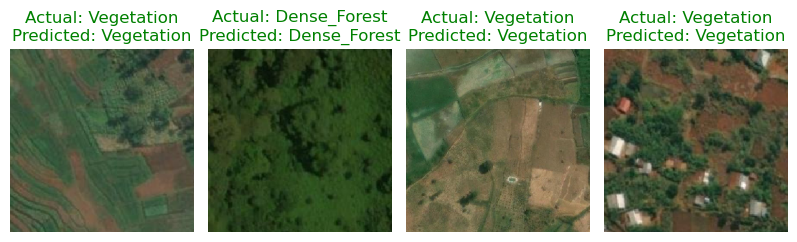

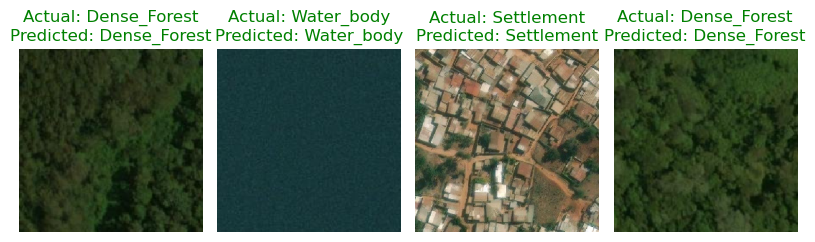

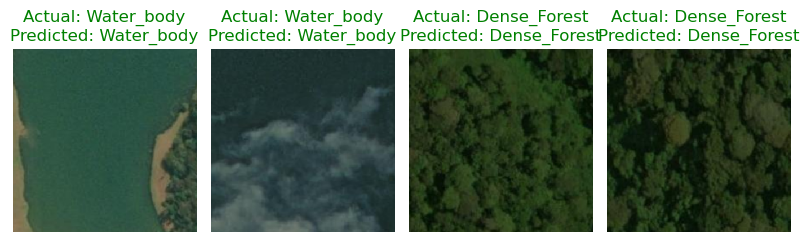

1/1 [==============================] - 4s 4s/step


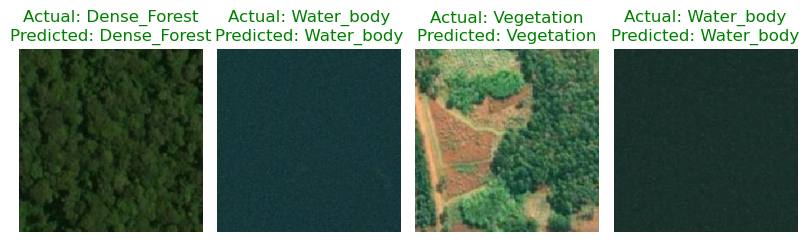

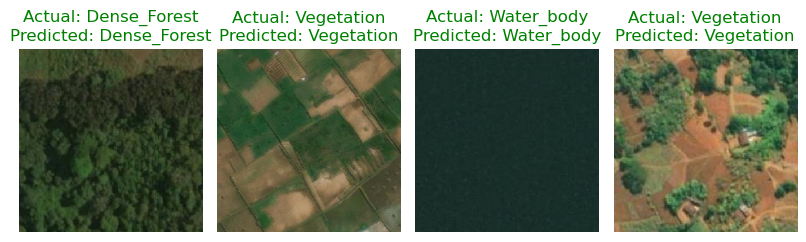

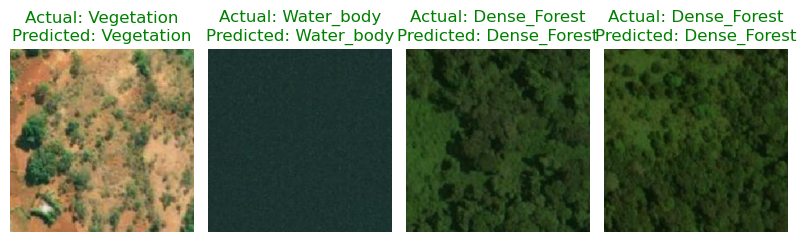

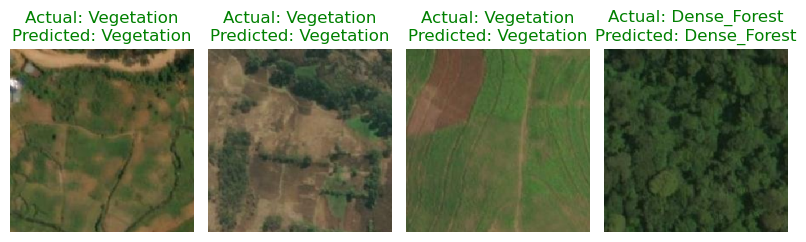

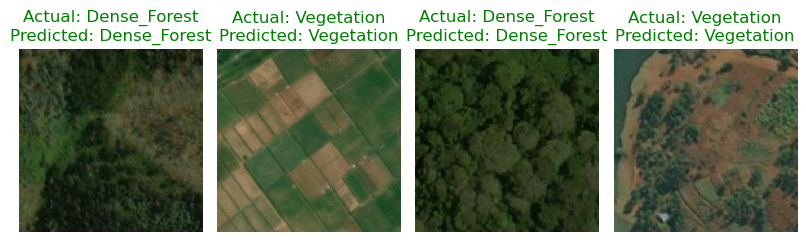

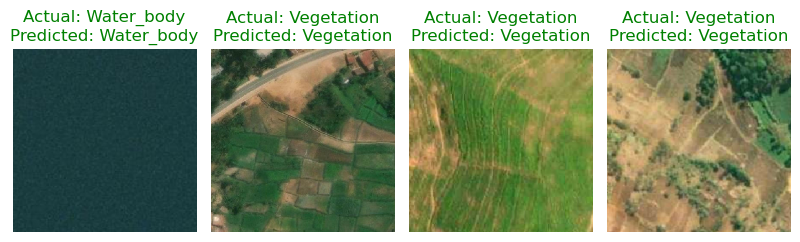

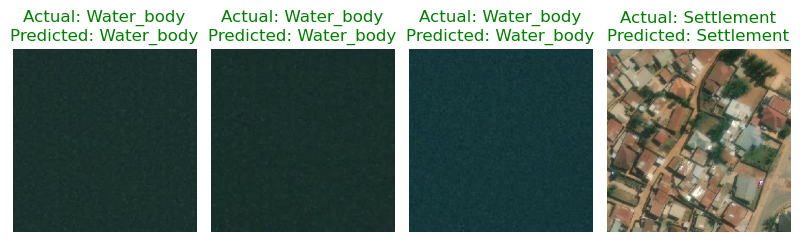

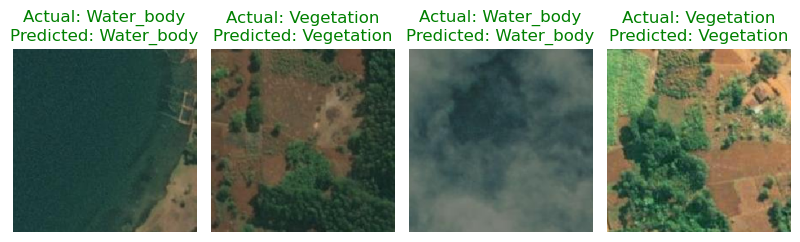

1/1 [==============================] - 8s 8s/step


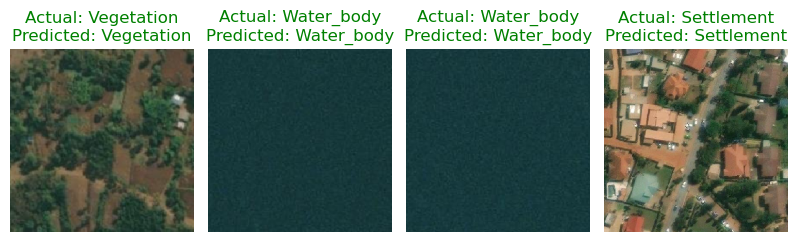

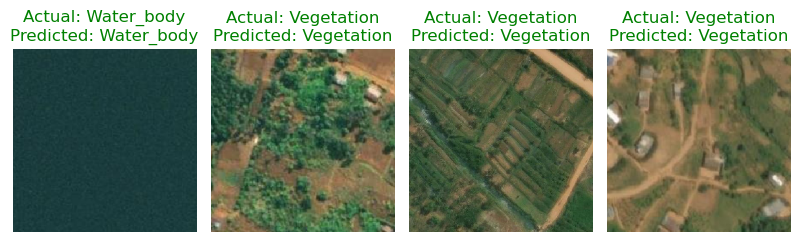

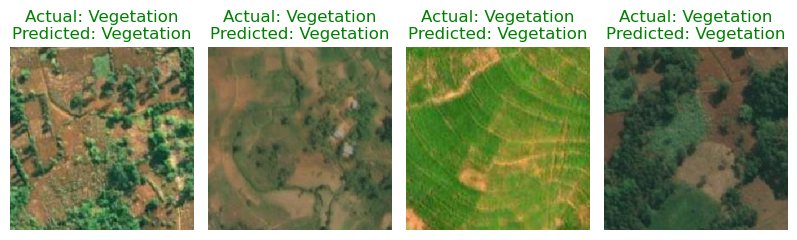

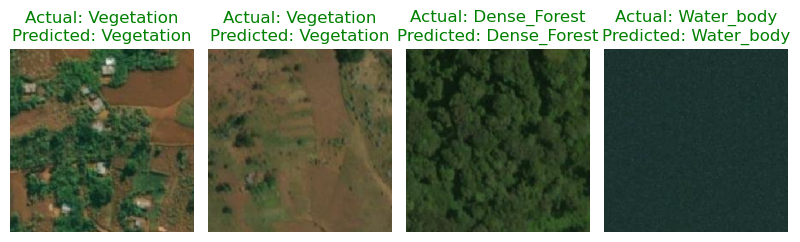

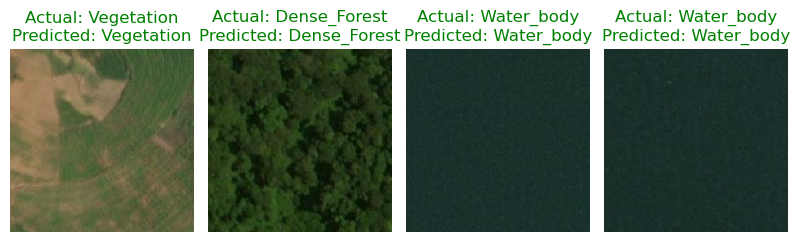

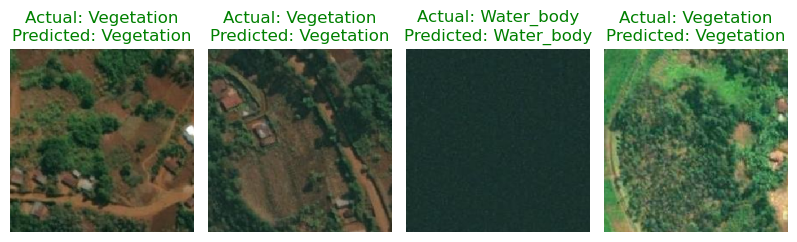

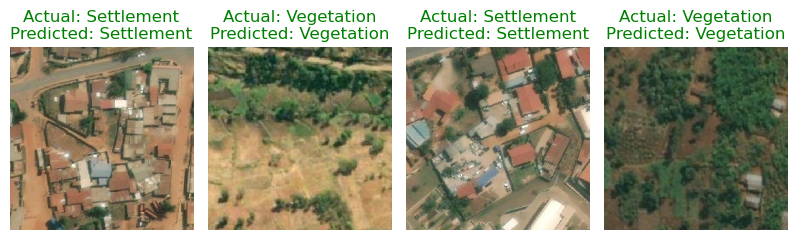

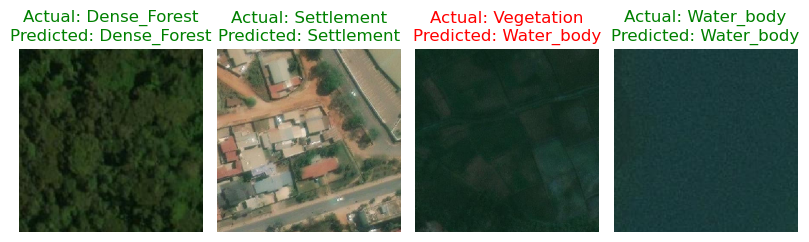

1/1 [==============================] - 9s 9s/step


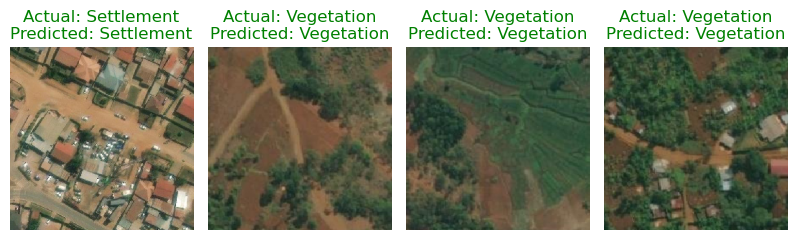

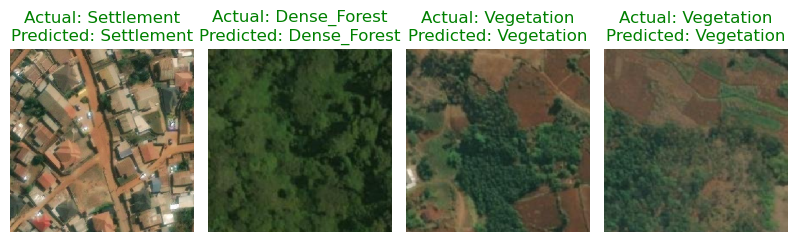

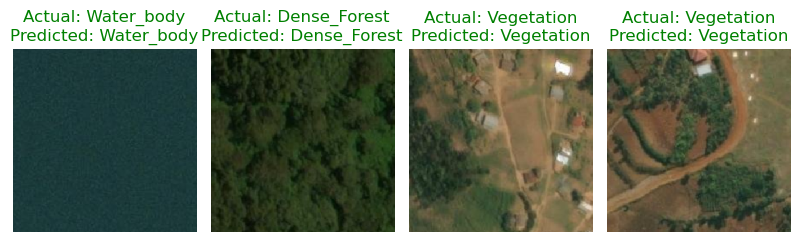

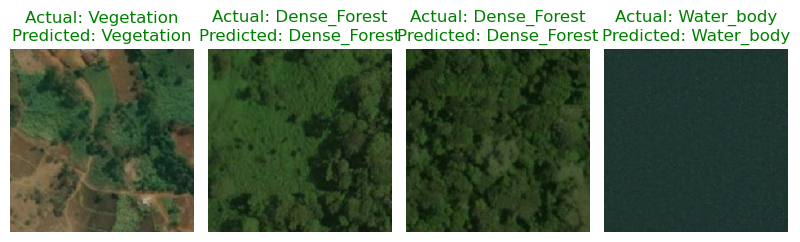

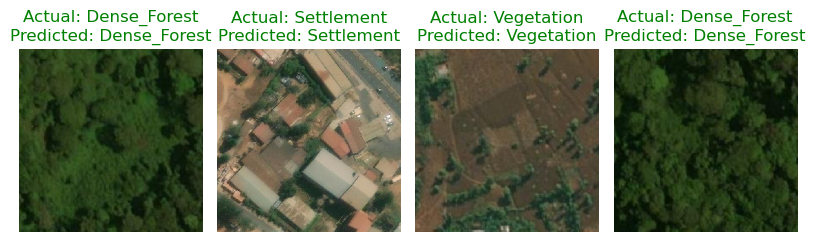

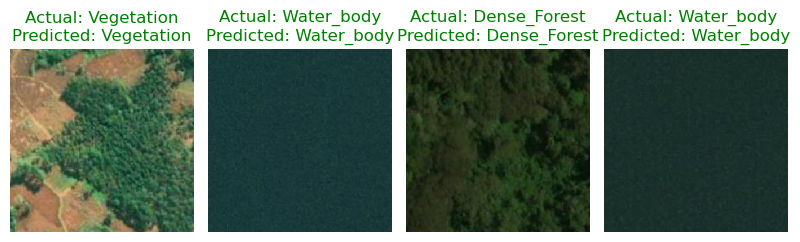

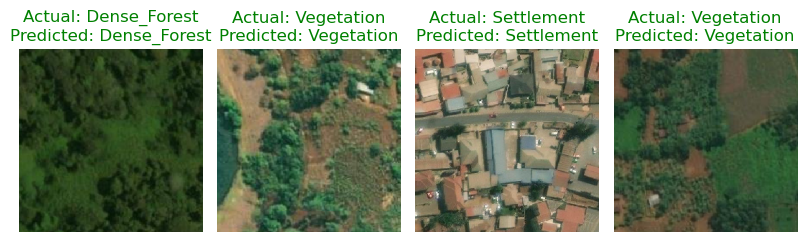

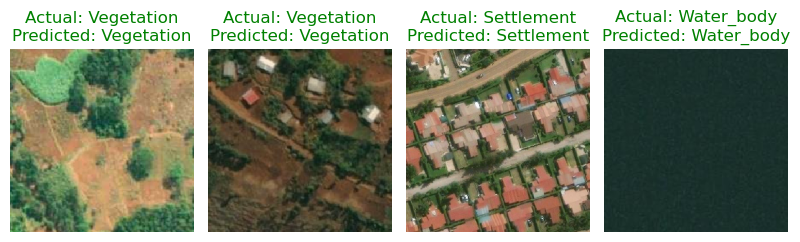

1/1 [==============================] - 7s 7s/step


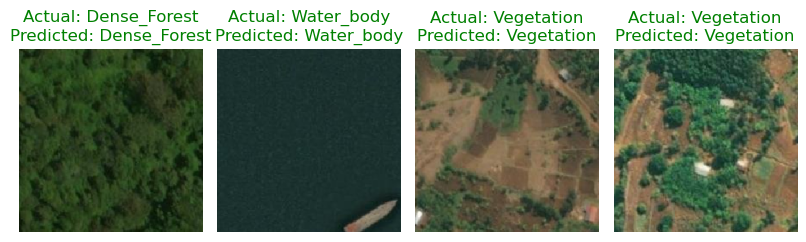

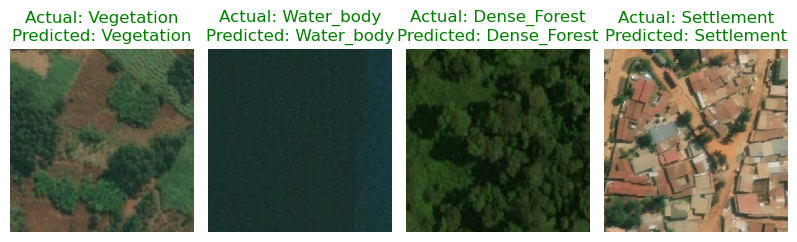

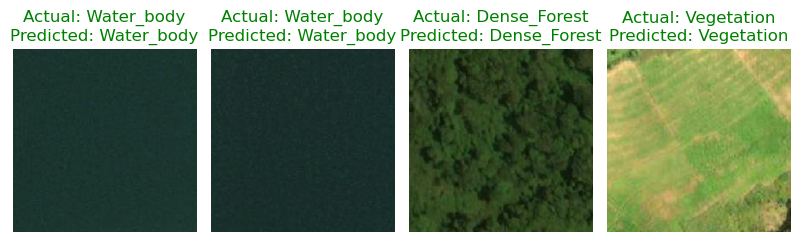

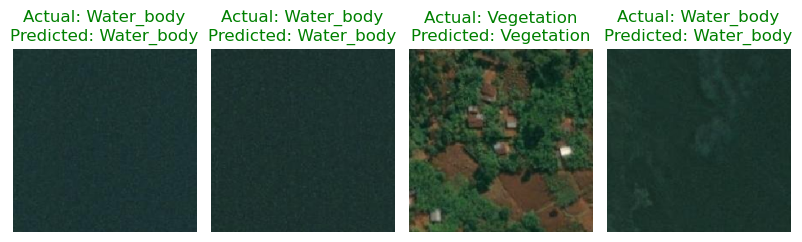

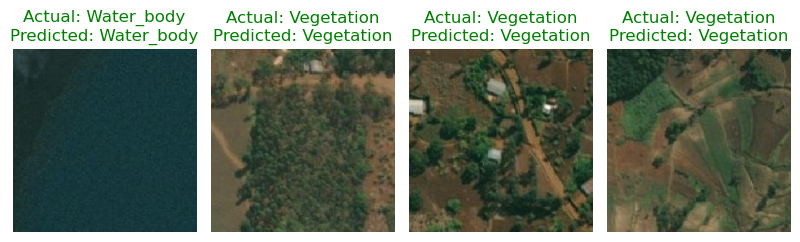

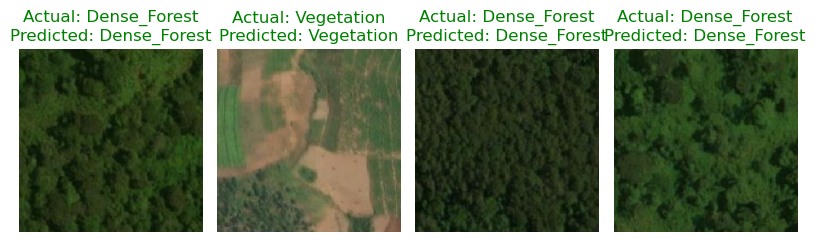

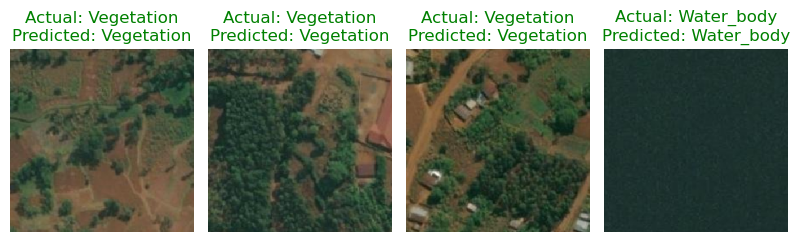

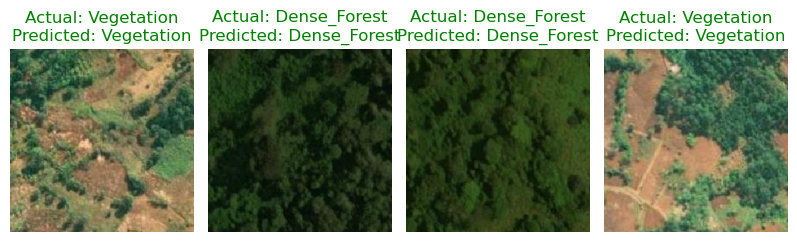

1/1 [==============================] - 8s 8s/step


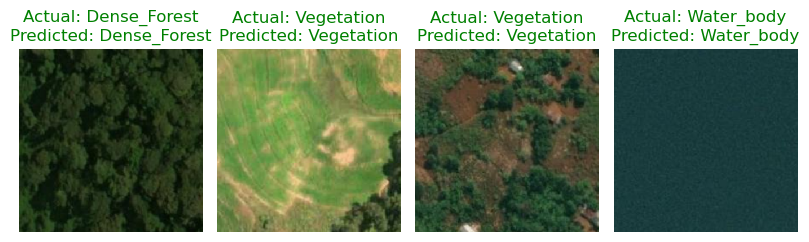

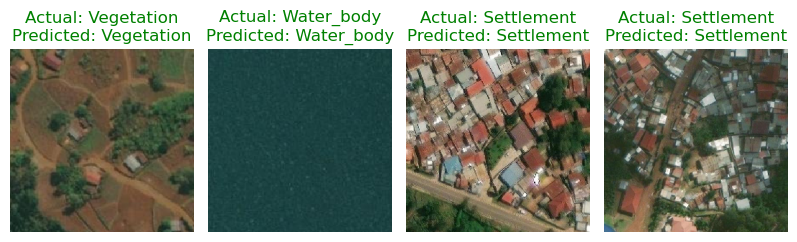

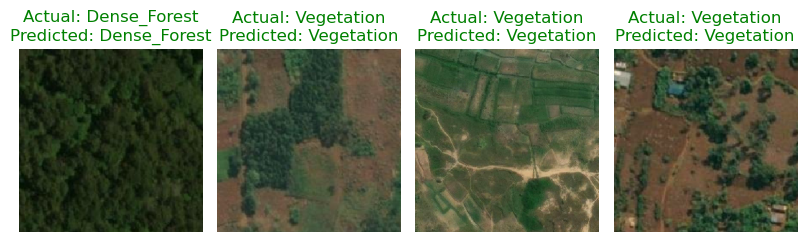

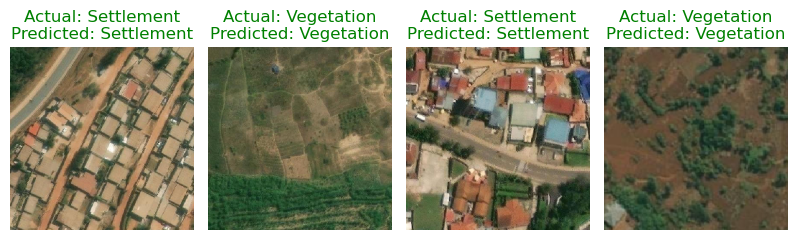

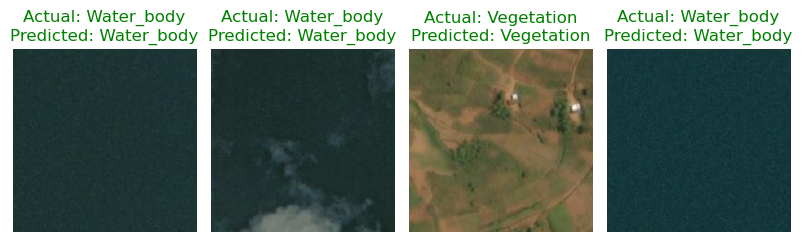

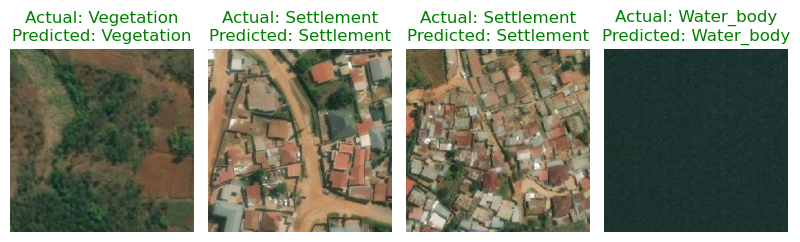

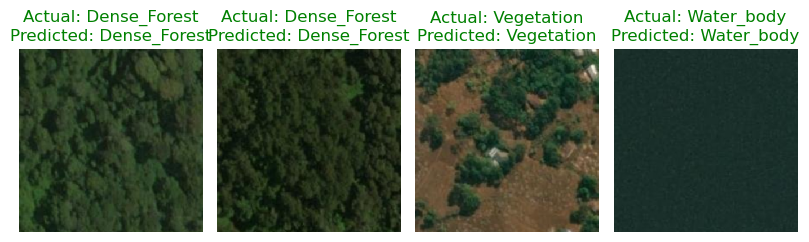

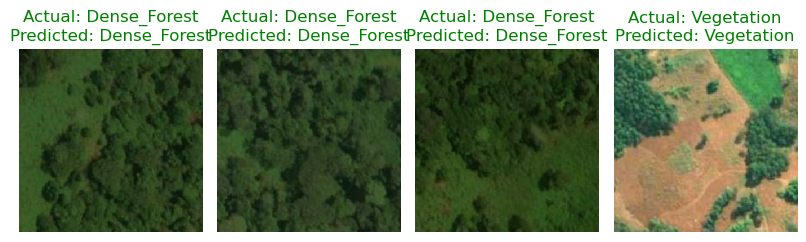

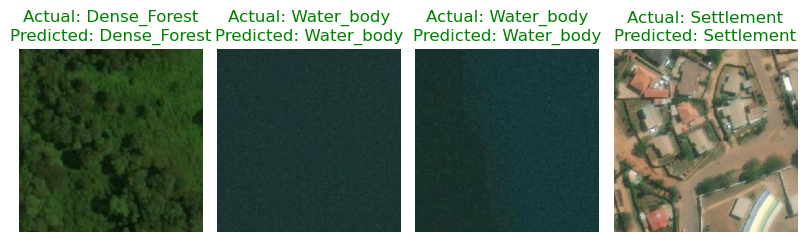

In [14]:
# Set the number of batches to display
num_batches = 6

# Create a new iterator for the test dataset
test_ds_iter = iter(test_ds)

# Display images and their labels from the first 2 batches
plt.figure(figsize=(16, 8))
image_count = 0
for batch_index in range(num_batches):
    # Retrieve the images and labels from the batch
    image_batch, label_batch = next(test_ds_iter)

    # Make predictions on the batch
    y_prob = loaded_model.predict(image_batch)

    # Convert the pixel values from [0, 1] range to [0, 255]
    image_batch = (image_batch * 255).astype("uint8")

    # Display the images and their labels
    for i in range(len(image_batch)):
        # Check if 8 images have been displayed in the row
        if image_count % 4 == 0 and image_count > 0:
            plt.tight_layout()
            plt.show()
            plt.figure(figsize=(16, 8))

        # Retrieve the image and its label
        image = image_batch[i]
        actual_label = class_names[np.argmax(label_batch[i])]
        predicted_label = class_names[np.argmax(y_prob[i])]

        # Determine the font color based on whether the labels match or not
        font_color = 'green' if actual_label == predicted_label else 'red'

        # Display the image
        plt.subplot(2, 8, image_count % 8 + 1)
        plt.imshow(image)
        plt.axis("off")

        # Display the image title with actual and predicted labels
        plt.title(f"Actual: {actual_label}\nPredicted: {predicted_label}", color=font_color)

        image_count += 1

# Ensure the last row is displayed properly
plt.tight_layout()
plt.show()


In [15]:
num_test_images = test_ds.n
print("Number of images in test_ds:", num_test_images)

Number of images in test_ds: 5321


In [16]:
import numpy as np
#import matplotlib.pyplot as plt
import pandas as pd 
import os.path
import re

from osgeo import gdal
from osgeo import gdal_array
from osgeo import osr

In [17]:
image_folder = './mydata/imagess'
image_files = os.listdir(image_folder)

In [18]:
tile_images = []

In [19]:
for filename in os.listdir(image_folder):
    if filename.endswith('.tif'):
        tile_images.append(os.path.join(image_folder, filename))

In [20]:
print(tile_images)

['./mydata/imagess\\._data_00001.tif', './mydata/imagess\\._data_00002.tif', './mydata/imagess\\._data_00003.tif', './mydata/imagess\\._data_00004.tif', './mydata/imagess\\._data_00005.tif', './mydata/imagess\\._data_00006.tif', './mydata/imagess\\._data_00007.tif', './mydata/imagess\\._data_00008.tif', './mydata/imagess\\._data_00009.tif', './mydata/imagess\\._data_00010.tif', './mydata/imagess\\._data_00011.tif', './mydata/imagess\\._data_00012.tif', './mydata/imagess\\._data_00013.tif', './mydata/imagess\\._data_00014.tif', './mydata/imagess\\._data_00015.tif', './mydata/imagess\\._data_00016.tif', './mydata/imagess\\._data_00017.tif', './mydata/imagess\\._data_00018.tif', './mydata/imagess\\._data_00019.tif', './mydata/imagess\\._data_00020.tif', './mydata/imagess\\._data_00021.tif', './mydata/imagess\\._data_00022.tif', './mydata/imagess\\._data_00023.tif', './mydata/imagess\\._data_00024.tif', './mydata/imagess\\._data_00025.tif', './mydata/imagess\\._data_00026.tif', './mydata/i

In [21]:
# Create a dictionary to map predicted class indices to values
class_dict = {0: 1, 1: 2, 2: 3, 3: 4}

In [22]:
# Create an empty list to store the pixel arrays for each image
pixel_arrays = []

In [65]:
for image_file in image_files:
    # Load the image
    image_path = os.path.join(image_folder, image_file)
    image = cv2.imread(image_path)
    # Perform any necessary preprocessing steps such as resizing, normalization, etc.
    # Make prediction
    prediction = loaded_model.predict(np.expand_dims(image, axis=0))

    # Get the predicted class index
    predicted_class_index = np.argmax(prediction)
    predicted_class_label = class_names[predicted_class_index]

    # Get the predicted class value from the dictionary
    predicted_class_value = class_dict[predicted_class_index]

    # Create a pixel array with the predicted class value
    pixel_array = np.full((256, 256, 3), predicted_class_value)

    # Append the pixel array to the list
    pixel_arrays.append(pixel_array)
    print(f"Image: {image_file}, predicted_class_value: {  predicted_class_label}")


1/1 [==============================] - 0s 351ms/step
Image: ._data_00001.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00002.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00003.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00004.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00005.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00006.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 296ms/step
Image: ._data_00007.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00008.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00009.tif, predicted_class_value: Settlement
1/1 [========

1/1 [==============================] - 1s 1s/step
Image: ._data_00076.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 257ms/step
Image: ._data_00077.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 222ms/step
Image: ._data_00078.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 216ms/step
Image: ._data_00079.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 222ms/step
Image: ._data_00080.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 305ms/step
Image: ._data_00081.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00082.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 296ms/step
Image: ._data_00083.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00084.tif, predicted_class_value: Settlement
1

1/1 [==============================] - 0s 219ms/step
Image: ._data_00150.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 312ms/step
Image: ._data_00151.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00152.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00153.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00154.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 396ms/step
Image: ._data_00155.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00156.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 274ms/step
Image: ._data_00157.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00158.tif, predicted_class_value: Settlement
1/1 [==

1/1 [==============================] - 1s 1s/step
Image: ._data_00224.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00225.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 513ms/step
Image: ._data_00226.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00227.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 232ms/step
Image: ._data_00228.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 345ms/step
Image: ._data_00229.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 994ms/step
Image: ._data_00230.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 237ms/step
Image: ._data_00231.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 224ms/step
Image: ._data_00232.tif, predicted_class_value: Settlement
1

1/1 [==============================] - 0s 261ms/step
Image: ._data_00298.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 305ms/step
Image: ._data_00299.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 287ms/step
Image: ._data_00300.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 344ms/step
Image: ._data_00301.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 302ms/step
Image: ._data_00302.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 303ms/step
Image: ._data_00303.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 272ms/step
Image: ._data_00304.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 234ms/step
Image: ._data_00305.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 408ms/step
Image: ._data_00306.tif, predicted_class_value: Set

1/1 [==============================] - 0s 232ms/step
Image: ._data_00372.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 352ms/step
Image: ._data_00373.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00374.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 299ms/step
Image: ._data_00375.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 378ms/step
Image: ._data_00376.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 300ms/step
Image: ._data_00377.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 401ms/step
Image: ._data_00378.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 922ms/step
Image: ._data_00379.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 263ms/step
Image: ._data_00380.tif, predicted_class_value: Settle

1/1 [==============================] - 1s 1s/step
Image: ._data_00446.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00447.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00448.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00449.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00450.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00451.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00452.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00453.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 273ms/step
Image: ._data_00454.tif, predicted_class_value: Settlement
1/1 [===========

1/1 [==============================] - 0s 247ms/step
Image: ._data_00520.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 235ms/step
Image: ._data_00521.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 268ms/step
Image: ._data_00522.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00523.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 241ms/step
Image: ._data_00524.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 244ms/step
Image: ._data_00525.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 450ms/step
Image: ._data_00526.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00527.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00528.tif, predicted_class_value: Settlement
1

1/1 [==============================] - 1s 1s/step
Image: ._data_00668.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 253ms/step
Image: ._data_00669.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 221ms/step
Image: ._data_00670.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 334ms/step
Image: ._data_00671.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00672.tif, predicted_class_value: Settlement
1/1 [==============================] - 1s 1s/step
Image: ._data_00673.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 217ms/step
Image: ._data_00674.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 226ms/step
Image: ._data_00675.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 237ms/step
Image: ._data_00676.tif, predicted_class_value: Vegetation
1

1/1 [==============================] - 0s 293ms/step
Image: ._data_00742.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 293ms/step
Image: ._data_00743.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 282ms/step
Image: ._data_00744.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 298ms/step
Image: ._data_00745.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 282ms/step
Image: ._data_00746.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 274ms/step
Image: ._data_00747.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 258ms/step
Image: ._data_00748.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 275ms/step
Image: ._data_00749.tif, predicted_class_value: Settlement
1/1 [==============================] - 0s 352ms/step
Image: ._data_00750.tif, predicted_class_value: Set

KeyboardInterrupt: 

## single Image

In [113]:
path200 = './mydata/imagess/._data_00069.tif'
image200 = cv2.imread(path200)

In [114]:
prediction = loaded_model.predict(np.expand_dims(image200, axis=0))

1/1 [==============================] - 0s 245ms/step


In [115]:
predicted_class_index = np.argmax(prediction)
predicted_class_label = class_names[predicted_class_index]
print(predicted_class_label)

Vegetation


In [122]:
from tensorflow.keras.preprocessing.image import load_img
image_path200 = './mydata/imagess/._data_00125.tif'
image200 = load_img(image_path200, target_size=(256, 256))

In [123]:
from tensorflow.keras.preprocessing.image import img_to_array
import numpy as np
image_array = img_to_array(image200)
image_array = image_array / 255.0

In [124]:
image_array = np.expand_dims(image_array, axis=0)

In [125]:
probs = loaded_model.predict(image_array)

1/1 [==============================] - 0s 273ms/step


In [126]:
class_index = np.argmax(probs, axis=-1)[0]
class_name = class_names[class_index]

In [127]:
print(class_name)

Settlement


### end of one image

## start of all tif images

In [23]:
import os
from tensorflow.keras.preprocessing.image import load_img, img_to_array
import numpy as np

# Get the list of TIF files in the image folder
tif_files = [f for f in os.listdir(image_folder) if f.endswith('.tif')]

# Loop over all TIF files and make predictions
for file in tif_files:
    # Load and preprocess the image
    image_path = os.path.join(image_folder, file)
    image = load_img(image_path, target_size=(256, 256))
    image_array = img_to_array(image)
    image_array = image_array / 255.0
    image_array = np.expand_dims(image_array, axis=0)

    # Make a prediction on the image
    probs = loaded_model.predict(image_array)
    class_index = np.argmax(probs, axis=-1)[0]
    # Get the predicted class value from the dictionary
    predicted_class_value = class_dict[class_index]
     # Create a pixel array with the predicted class value
    pixel_array = np.full((256, 256, 3), predicted_class_value)
    # Append the pixel array to the list
    pixel_arrays.append(pixel_array)
    class_name = class_names[class_index]

    # Print the predicted class for the -
    print(f"{file}: {class_name}")

1/1 [==============================] - 2s 2s/step
._data_00001.tif: Settlement
1/1 [==============================] - 0s 434ms/step
._data_00002.tif: Settlement
1/1 [==============================] - 0s 459ms/step
._data_00003.tif: Vegetation
1/1 [==============================] - 0s 451ms/step
._data_00004.tif: Settlement
1/1 [==============================] - 0s 409ms/step
._data_00005.tif: Vegetation
1/1 [==============================] - 0s 466ms/step
._data_00006.tif: Vegetation
1/1 [==============================] - 0s 229ms/step
._data_00007.tif: Vegetation
1/1 [==============================] - 1s 550ms/step
._data_00008.tif: Vegetation
1/1 [==============================] - 1s 568ms/step
._data_00009.tif: Vegetation
1/1 [==============================] - 0s 452ms/step
._data_00010.tif: Settlement
1/1 [==============================] - 0s 384ms/step
._data_00011.tif: Vegetation
1/1 [==============================] - 0s 415ms/step
._data_00012.tif: Settlement
1/1 [==============

1/1 [==============================] - 0s 446ms/step
._data_00101.tif: Vegetation
1/1 [==============================] - 1s 600ms/step
._data_00102.tif: Vegetation
1/1 [==============================] - 0s 152ms/step
._data_00103.tif: Vegetation
1/1 [==============================] - 0s 216ms/step
._data_00104.tif: Vegetation
1/1 [==============================] - 0s 214ms/step
._data_00105.tif: Vegetation
1/1 [==============================] - 0s 280ms/step
._data_00106.tif: Vegetation
1/1 [==============================] - 0s 359ms/step
._data_00107.tif: Vegetation
1/1 [==============================] - 1s 550ms/step
._data_00108.tif: Vegetation
1/1 [==============================] - 1s 529ms/step
._data_00109.tif: Vegetation
1/1 [==============================] - 0s 474ms/step
._data_00110.tif: Vegetation
1/1 [==============================] - 0s 467ms/step
._data_00111.tif: Settlement
1/1 [==============================] - 0s 448ms/step
._data_00112.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 537ms/step
._data_00201.tif: Vegetation
1/1 [==============================] - 0s 448ms/step
._data_00202.tif: Vegetation
1/1 [==============================] - 0s 491ms/step
._data_00203.tif: Vegetation
1/1 [==============================] - 1s 559ms/step
._data_00204.tif: Vegetation
1/1 [==============================] - 1s 534ms/step
._data_00205.tif: Vegetation
1/1 [==============================] - 0s 488ms/step
._data_00206.tif: Vegetation
1/1 [==============================] - 1s 561ms/step
._data_00207.tif: Settlement
1/1 [==============================] - 0s 467ms/step
._data_00208.tif: Settlement
1/1 [==============================] - 1s 603ms/step
._data_00209.tif: Vegetation
1/1 [==============================] - 0s 486ms/step
._data_00210.tif: Vegetation
1/1 [==============================] - 0s 444ms/step
._data_00211.tif: Vegetation
1/1 [==============================] - 0s 488ms/step
._data_00212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 411ms/step
._data_00301.tif: Vegetation
1/1 [==============================] - 0s 397ms/step
._data_00302.tif: Vegetation
1/1 [==============================] - 0s 447ms/step
._data_00303.tif: Vegetation
1/1 [==============================] - 0s 455ms/step
._data_00304.tif: Vegetation
1/1 [==============================] - 0s 424ms/step
._data_00305.tif: Vegetation
1/1 [==============================] - 0s 448ms/step
._data_00306.tif: Vegetation
1/1 [==============================] - 0s 429ms/step
._data_00307.tif: Vegetation
1/1 [==============================] - 0s 462ms/step
._data_00308.tif: Vegetation
1/1 [==============================] - 0s 458ms/step
._data_00309.tif: Vegetation
1/1 [==============================] - 0s 419ms/step
._data_00310.tif: Vegetation
1/1 [==============================] - 0s 438ms/step
._data_00311.tif: Settlement
1/1 [==============================] - 0s 469ms/step
._data_00312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 403ms/step
._data_00401.tif: Vegetation
1/1 [==============================] - 0s 448ms/step
._data_00402.tif: Vegetation
1/1 [==============================] - 0s 454ms/step
._data_00403.tif: Settlement
1/1 [==============================] - 0s 429ms/step
._data_00404.tif: Settlement
1/1 [==============================] - 0s 409ms/step
._data_00405.tif: Settlement
1/1 [==============================] - 0s 475ms/step
._data_00406.tif: Settlement
1/1 [==============================] - 0s 425ms/step
._data_00407.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_00408.tif: Settlement
1/1 [==============================] - 0s 463ms/step
._data_00409.tif: Settlement
1/1 [==============================] - 0s 448ms/step
._data_00410.tif: Vegetation
1/1 [==============================] - 0s 395ms/step
._data_00411.tif: Vegetation
1/1 [==============================] - 0s 421ms/step
._data_00412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 430ms/step
._data_00501.tif: Vegetation
1/1 [==============================] - 0s 482ms/step
._data_00502.tif: Settlement
1/1 [==============================] - 0s 404ms/step
._data_00503.tif: Vegetation
1/1 [==============================] - 0s 407ms/step
._data_00504.tif: Vegetation
1/1 [==============================] - 0s 443ms/step
._data_00505.tif: Dense_Forest
1/1 [==============================] - 0s 451ms/step
._data_00506.tif: Vegetation
1/1 [==============================] - 0s 458ms/step
._data_00507.tif: Vegetation
1/1 [==============================] - 0s 463ms/step
._data_00508.tif: Vegetation
1/1 [==============================] - 0s 431ms/step
._data_00509.tif: Vegetation
1/1 [==============================] - 0s 450ms/step
._data_00510.tif: Vegetation
1/1 [==============================] - 0s 440ms/step
._data_00511.tif: Vegetation
1/1 [==============================] - 0s 445ms/step
._data_00512.tif: Vegetation
1/1 [=========

1/1 [==============================] - 0s 435ms/step
._data_00601.tif: Vegetation
1/1 [==============================] - 0s 409ms/step
._data_00602.tif: Vegetation
1/1 [==============================] - 0s 402ms/step
._data_00603.tif: Vegetation
1/1 [==============================] - 0s 468ms/step
._data_00604.tif: Vegetation
1/1 [==============================] - 0s 402ms/step
._data_00605.tif: Vegetation
1/1 [==============================] - 0s 435ms/step
._data_00606.tif: Vegetation
1/1 [==============================] - 0s 450ms/step
._data_00607.tif: Vegetation
1/1 [==============================] - 0s 449ms/step
._data_00608.tif: Vegetation
1/1 [==============================] - 0s 424ms/step
._data_00609.tif: Vegetation
1/1 [==============================] - 0s 453ms/step
._data_00610.tif: Vegetation
1/1 [==============================] - 0s 449ms/step
._data_00611.tif: Vegetation
1/1 [==============================] - 0s 453ms/step
._data_00612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 626ms/step
._data_00701.tif: Water_body
1/1 [==============================] - 1s 923ms/step
._data_00702.tif: Vegetation
1/1 [==============================] - 1s 768ms/step
._data_00703.tif: Water_body
1/1 [==============================] - 0s 316ms/step
._data_00704.tif: Water_body
1/1 [==============================] - 0s 471ms/step
._data_00705.tif: Water_body
1/1 [==============================] - 0s 307ms/step
._data_00706.tif: Dense_Forest
1/1 [==============================] - 0s 321ms/step
._data_00707.tif: Dense_Forest
1/1 [==============================] - 1s 597ms/step
._data_00708.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_00709.tif: Vegetation
1/1 [==============================] - 1s 674ms/step
._data_00710.tif: Vegetation
1/1 [==============================] - 1s 656ms/step
._data_00711.tif: Vegetation
1/1 [==============================] - 1s 699ms/step
._data_00712.tif: Vegetation
1/1 [=======

1/1 [==============================] - 1s 629ms/step
._data_00801.tif: Vegetation
1/1 [==============================] - 1s 660ms/step
._data_00802.tif: Vegetation
1/1 [==============================] - 1s 699ms/step
._data_00803.tif: Vegetation
1/1 [==============================] - 1s 668ms/step
._data_00804.tif: Vegetation
1/1 [==============================] - 1s 737ms/step
._data_00805.tif: Settlement
1/1 [==============================] - 1s 647ms/step
._data_00806.tif: Settlement
1/1 [==============================] - 1s 650ms/step
._data_00807.tif: Vegetation
1/1 [==============================] - 1s 668ms/step
._data_00808.tif: Vegetation
1/1 [==============================] - 1s 616ms/step
._data_00809.tif: Vegetation
1/1 [==============================] - 1s 663ms/step
._data_00810.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_00811.tif: Vegetation
1/1 [==============================] - 1s 667ms/step
._data_00812.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 699ms/step
._data_00901.tif: Settlement
1/1 [==============================] - 1s 683ms/step
._data_00902.tif: Vegetation
1/1 [==============================] - 1s 706ms/step
._data_00903.tif: Settlement
1/1 [==============================] - 1s 720ms/step
._data_00904.tif: Vegetation
1/1 [==============================] - 1s 675ms/step
._data_00905.tif: Vegetation
1/1 [==============================] - 1s 671ms/step
._data_00906.tif: Vegetation
1/1 [==============================] - 1s 683ms/step
._data_00907.tif: Vegetation
1/1 [==============================] - 1s 655ms/step
._data_00908.tif: Vegetation
1/1 [==============================] - 1s 618ms/step
._data_00909.tif: Settlement
1/1 [==============================] - 1s 673ms/step
._data_00910.tif: Settlement
1/1 [==============================] - 1s 674ms/step
._data_00911.tif: Vegetation
1/1 [==============================] - 1s 593ms/step
._data_00912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 951ms/step
._data_01001.tif: Vegetation
1/1 [==============================] - 1s 656ms/step
._data_01002.tif: Vegetation
1/1 [==============================] - 1s 663ms/step
._data_01003.tif: Vegetation
1/1 [==============================] - 1s 620ms/step
._data_01004.tif: Vegetation
1/1 [==============================] - 1s 669ms/step
._data_01005.tif: Vegetation
1/1 [==============================] - 1s 714ms/step
._data_01006.tif: Vegetation
1/1 [==============================] - 1s 640ms/step
._data_01007.tif: Vegetation
1/1 [==============================] - 1s 693ms/step
._data_01008.tif: Settlement
1/1 [==============================] - 1s 677ms/step
._data_01009.tif: Settlement
1/1 [==============================] - 1s 637ms/step
._data_01010.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_01011.tif: Settlement
1/1 [==============================] - 1s 669ms/step
._data_01012.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 686ms/step
._data_01101.tif: Settlement
1/1 [==============================] - 1s 671ms/step
._data_01102.tif: Vegetation
1/1 [==============================] - 1s 693ms/step
._data_01103.tif: Vegetation
1/1 [==============================] - 1s 682ms/step
._data_01104.tif: Vegetation
1/1 [==============================] - 1s 677ms/step
._data_01105.tif: Vegetation
1/1 [==============================] - 1s 709ms/step
._data_01106.tif: Settlement
1/1 [==============================] - 1s 711ms/step
._data_01107.tif: Settlement
1/1 [==============================] - 1s 714ms/step
._data_01108.tif: Vegetation
1/1 [==============================] - 1s 729ms/step
._data_01109.tif: Vegetation
1/1 [==============================] - 1s 661ms/step
._data_01110.tif: Vegetation
1/1 [==============================] - 1s 755ms/step
._data_01111.tif: Vegetation
1/1 [==============================] - 1s 687ms/step
._data_01112.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 678ms/step
._data_01201.tif: Vegetation
1/1 [==============================] - 1s 643ms/step
._data_01202.tif: Vegetation
1/1 [==============================] - 1s 646ms/step
._data_01203.tif: Vegetation
1/1 [==============================] - 1s 679ms/step
._data_01204.tif: Vegetation
1/1 [==============================] - 1s 639ms/step
._data_01205.tif: Vegetation
1/1 [==============================] - 1s 652ms/step
._data_01206.tif: Vegetation
1/1 [==============================] - 1s 667ms/step
._data_01207.tif: Vegetation
1/1 [==============================] - 1s 669ms/step
._data_01208.tif: Vegetation
1/1 [==============================] - 1s 704ms/step
._data_01209.tif: Vegetation
1/1 [==============================] - 1s 730ms/step
._data_01210.tif: Vegetation
1/1 [==============================] - 1s 629ms/step
._data_01211.tif: Vegetation
1/1 [==============================] - 1s 599ms/step
._data_01212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 638ms/step
._data_01301.tif: Vegetation
1/1 [==============================] - 1s 697ms/step
._data_01302.tif: Vegetation
1/1 [==============================] - 1s 704ms/step
._data_01303.tif: Vegetation
1/1 [==============================] - 1s 650ms/step
._data_01304.tif: Vegetation
1/1 [==============================] - 1s 732ms/step
._data_01305.tif: Vegetation
1/1 [==============================] - 1s 690ms/step
._data_01306.tif: Settlement
1/1 [==============================] - 1s 736ms/step
._data_01307.tif: Vegetation
1/1 [==============================] - 1s 731ms/step
._data_01308.tif: Vegetation
1/1 [==============================] - 1s 679ms/step
._data_01309.tif: Vegetation
1/1 [==============================] - 1s 645ms/step
._data_01310.tif: Vegetation
1/1 [==============================] - 1s 671ms/step
._data_01311.tif: Vegetation
1/1 [==============================] - 1s 687ms/step
._data_01312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 691ms/step
._data_01401.tif: Settlement
1/1 [==============================] - 1s 670ms/step
._data_01402.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_01403.tif: Settlement
1/1 [==============================] - 1s 695ms/step
._data_01404.tif: Vegetation
1/1 [==============================] - 1s 714ms/step
._data_01405.tif: Vegetation
1/1 [==============================] - 1s 626ms/step
._data_01406.tif: Vegetation
1/1 [==============================] - 1s 675ms/step
._data_01407.tif: Vegetation
1/1 [==============================] - 1s 682ms/step
._data_01408.tif: Vegetation
1/1 [==============================] - 1s 652ms/step
._data_01409.tif: Vegetation
1/1 [==============================] - 1s 646ms/step
._data_01410.tif: Vegetation
1/1 [==============================] - 1s 709ms/step
._data_01411.tif: Vegetation
1/1 [==============================] - 1s 682ms/step
._data_01412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 673ms/step
._data_01501.tif: Vegetation
1/1 [==============================] - 1s 676ms/step
._data_01502.tif: Vegetation
1/1 [==============================] - 1s 646ms/step
._data_01503.tif: Settlement
1/1 [==============================] - 1s 643ms/step
._data_01504.tif: Settlement
1/1 [==============================] - 1s 656ms/step
._data_01505.tif: Settlement
1/1 [==============================] - 1s 661ms/step
._data_01506.tif: Vegetation
1/1 [==============================] - 1s 666ms/step
._data_01507.tif: Vegetation
1/1 [==============================] - 1s 668ms/step
._data_01508.tif: Settlement
1/1 [==============================] - 1s 742ms/step
._data_01509.tif: Settlement
1/1 [==============================] - 1s 744ms/step
._data_01510.tif: Settlement
1/1 [==============================] - 1s 699ms/step
._data_01511.tif: Settlement
1/1 [==============================] - 1s 699ms/step
._data_01512.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 656ms/step
._data_01601.tif: Settlement
1/1 [==============================] - 1s 674ms/step
._data_01602.tif: Settlement
1/1 [==============================] - 1s 696ms/step
._data_01603.tif: Vegetation
1/1 [==============================] - 1s 662ms/step
._data_01604.tif: Vegetation
1/1 [==============================] - 1s 693ms/step
._data_01605.tif: Vegetation
1/1 [==============================] - 1s 664ms/step
._data_01606.tif: Vegetation
1/1 [==============================] - 1s 700ms/step
._data_01607.tif: Vegetation
1/1 [==============================] - 1s 733ms/step
._data_01608.tif: Vegetation
1/1 [==============================] - 1s 748ms/step
._data_01609.tif: Vegetation
1/1 [==============================] - 1s 724ms/step
._data_01610.tif: Vegetation
1/1 [==============================] - 1s 669ms/step
._data_01611.tif: Vegetation
1/1 [==============================] - 1s 648ms/step
._data_01612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 656ms/step
._data_01701.tif: Settlement
1/1 [==============================] - 1s 669ms/step
._data_01702.tif: Settlement
1/1 [==============================] - 1s 673ms/step
._data_01703.tif: Vegetation
1/1 [==============================] - 1s 642ms/step
._data_01704.tif: Vegetation
1/1 [==============================] - 1s 669ms/step
._data_01705.tif: Vegetation
1/1 [==============================] - 1s 658ms/step
._data_01706.tif: Vegetation
1/1 [==============================] - 1s 681ms/step
._data_01707.tif: Vegetation
1/1 [==============================] - 0s 335ms/step
._data_01708.tif: Vegetation
1/1 [==============================] - 1s 728ms/step
._data_01709.tif: Vegetation
1/1 [==============================] - 1s 687ms/step
._data_01710.tif: Settlement
1/1 [==============================] - 1s 640ms/step
._data_01711.tif: Settlement
1/1 [==============================] - 1s 638ms/step
._data_01712.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 873ms/step
._data_01801.tif: Settlement
1/1 [==============================] - 0s 469ms/step
._data_01802.tif: Settlement
1/1 [==============================] - 1s 647ms/step
._data_01803.tif: Vegetation
1/1 [==============================] - 1s 675ms/step
._data_01804.tif: Settlement
1/1 [==============================] - 1s 667ms/step
._data_01805.tif: Vegetation
1/1 [==============================] - 1s 652ms/step
._data_01806.tif: Settlement
1/1 [==============================] - 1s 644ms/step
._data_01807.tif: Settlement
1/1 [==============================] - 1s 666ms/step
._data_01808.tif: Settlement
1/1 [==============================] - 1s 634ms/step
._data_01809.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_01810.tif: Settlement
1/1 [==============================] - 1s 832ms/step
._data_01811.tif: Settlement
1/1 [==============================] - 1s 653ms/step
._data_01812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 721ms/step
._data_01901.tif: Settlement
1/1 [==============================] - 1s 767ms/step
._data_01902.tif: Settlement
1/1 [==============================] - 1s 658ms/step
._data_01903.tif: Settlement
1/1 [==============================] - 1s 637ms/step
._data_01904.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_01905.tif: Settlement
1/1 [==============================] - 1s 690ms/step
._data_01906.tif: Settlement
1/1 [==============================] - 1s 832ms/step
._data_01907.tif: Settlement
1/1 [==============================] - 1s 768ms/step
._data_01908.tif: Settlement
1/1 [==============================] - 1s 649ms/step
._data_01909.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_01910.tif: Settlement
1/1 [==============================] - 1s 706ms/step
._data_01911.tif: Settlement
1/1 [==============================] - 1s 680ms/step
._data_01912.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 661ms/step
._data_02001.tif: Settlement
1/1 [==============================] - 1s 677ms/step
._data_02002.tif: Settlement
1/1 [==============================] - 1s 655ms/step
._data_02003.tif: Settlement
1/1 [==============================] - 1s 705ms/step
._data_02004.tif: Settlement
1/1 [==============================] - 1s 684ms/step
._data_02005.tif: Settlement
1/1 [==============================] - 1s 673ms/step
._data_02006.tif: Settlement
1/1 [==============================] - 1s 719ms/step
._data_02007.tif: Settlement
1/1 [==============================] - 1s 650ms/step
._data_02008.tif: Settlement
1/1 [==============================] - 1s 723ms/step
._data_02009.tif: Settlement
1/1 [==============================] - 1s 682ms/step
._data_02010.tif: Settlement
1/1 [==============================] - 1s 717ms/step
._data_02011.tif: Settlement
1/1 [==============================] - 1s 680ms/step
._data_02012.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 666ms/step
._data_02101.tif: Vegetation
1/1 [==============================] - 1s 673ms/step
._data_02102.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_02103.tif: Settlement
1/1 [==============================] - 1s 663ms/step
._data_02104.tif: Settlement
1/1 [==============================] - 1s 718ms/step
._data_02105.tif: Settlement
1/1 [==============================] - 1s 678ms/step
._data_02106.tif: Settlement
1/1 [==============================] - 1s 694ms/step
._data_02107.tif: Vegetation
1/1 [==============================] - 1s 675ms/step
._data_02108.tif: Settlement
1/1 [==============================] - 1s 677ms/step
._data_02109.tif: Settlement
1/1 [==============================] - 1s 712ms/step
._data_02110.tif: Settlement
1/1 [==============================] - 1s 754ms/step
._data_02111.tif: Settlement
1/1 [==============================] - 1s 726ms/step
._data_02112.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 674ms/step
._data_02201.tif: Vegetation
1/1 [==============================] - 1s 697ms/step
._data_02202.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_02203.tif: Settlement
1/1 [==============================] - 1s 829ms/step
._data_02204.tif: Settlement
1/1 [==============================] - 1s 678ms/step
._data_02205.tif: Settlement
1/1 [==============================] - 1s 696ms/step
._data_02206.tif: Settlement
1/1 [==============================] - 1s 658ms/step
._data_02207.tif: Settlement
1/1 [==============================] - 1s 707ms/step
._data_02208.tif: Settlement
1/1 [==============================] - 1s 717ms/step
._data_02209.tif: Vegetation
1/1 [==============================] - 1s 685ms/step
._data_02210.tif: Vegetation
1/1 [==============================] - 1s 661ms/step
._data_02211.tif: Vegetation
1/1 [==============================] - 1s 654ms/step
._data_02212.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 653ms/step
._data_02301.tif: Vegetation
1/1 [==============================] - 1s 677ms/step
._data_02302.tif: Vegetation
1/1 [==============================] - 1s 700ms/step
._data_02303.tif: Vegetation
1/1 [==============================] - 1s 674ms/step
._data_02304.tif: Settlement
1/1 [==============================] - 1s 670ms/step
._data_02305.tif: Vegetation
1/1 [==============================] - 1s 668ms/step
._data_02306.tif: Settlement
1/1 [==============================] - 1s 726ms/step
._data_02307.tif: Vegetation
1/1 [==============================] - 1s 674ms/step
._data_02308.tif: Vegetation
1/1 [==============================] - 1s 715ms/step
._data_02309.tif: Vegetation
1/1 [==============================] - 1s 754ms/step
._data_02310.tif: Vegetation
1/1 [==============================] - 1s 681ms/step
._data_02311.tif: Vegetation
1/1 [==============================] - 1s 712ms/step
._data_02312.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 676ms/step
._data_02401.tif: Settlement
1/1 [==============================] - 1s 661ms/step
._data_02402.tif: Settlement
1/1 [==============================] - 1s 720ms/step
._data_02403.tif: Vegetation
1/1 [==============================] - 1s 652ms/step
._data_02404.tif: Vegetation
1/1 [==============================] - 1s 685ms/step
._data_02405.tif: Vegetation
1/1 [==============================] - 1s 679ms/step
._data_02406.tif: Settlement
1/1 [==============================] - 1s 706ms/step
._data_02407.tif: Settlement
1/1 [==============================] - 1s 683ms/step
._data_02408.tif: Vegetation
1/1 [==============================] - 1s 720ms/step
._data_02409.tif: Vegetation
1/1 [==============================] - 1s 669ms/step
._data_02410.tif: Vegetation
1/1 [==============================] - 1s 706ms/step
._data_02411.tif: Vegetation
1/1 [==============================] - 1s 679ms/step
._data_02412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 697ms/step
._data_02501.tif: Settlement
1/1 [==============================] - 1s 742ms/step
._data_02502.tif: Vegetation
1/1 [==============================] - 1s 667ms/step
._data_02503.tif: Vegetation
1/1 [==============================] - 1s 627ms/step
._data_02504.tif: Vegetation
1/1 [==============================] - 1s 678ms/step
._data_02505.tif: Vegetation
1/1 [==============================] - 1s 658ms/step
._data_02506.tif: Vegetation
1/1 [==============================] - 1s 655ms/step
._data_02507.tif: Vegetation
1/1 [==============================] - 1s 693ms/step
._data_02508.tif: Settlement
1/1 [==============================] - 1s 682ms/step
._data_02509.tif: Settlement
1/1 [==============================] - 1s 668ms/step
._data_02510.tif: Settlement
1/1 [==============================] - 1s 694ms/step
._data_02511.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_02512.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 719ms/step
._data_02601.tif: Vegetation
1/1 [==============================] - 1s 666ms/step
._data_02602.tif: Vegetation
1/1 [==============================] - 1s 677ms/step
._data_02603.tif: Vegetation
1/1 [==============================] - 1s 676ms/step
._data_02604.tif: Water_body
1/1 [==============================] - 1s 671ms/step
._data_02605.tif: Vegetation
1/1 [==============================] - 1s 721ms/step
._data_02606.tif: Vegetation
1/1 [==============================] - 1s 695ms/step
._data_02607.tif: Vegetation
1/1 [==============================] - 1s 690ms/step
._data_02608.tif: Vegetation
1/1 [==============================] - 1s 677ms/step
._data_02609.tif: Settlement
1/1 [==============================] - 1s 688ms/step
._data_02610.tif: Settlement
1/1 [==============================] - 1s 697ms/step
._data_02611.tif: Settlement
1/1 [==============================] - 1s 722ms/step
._data_02612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 689ms/step
._data_02701.tif: Settlement
1/1 [==============================] - 1s 734ms/step
._data_02702.tif: Settlement
1/1 [==============================] - 1s 709ms/step
._data_02703.tif: Settlement
1/1 [==============================] - 1s 695ms/step
._data_02704.tif: Settlement
1/1 [==============================] - 1s 756ms/step
._data_02705.tif: Settlement
1/1 [==============================] - 1s 577ms/step
._data_02706.tif: Vegetation
1/1 [==============================] - 1s 757ms/step
._data_02707.tif: Vegetation
1/1 [==============================] - 1s 774ms/step
._data_02708.tif: Vegetation
1/1 [==============================] - 1s 710ms/step
._data_02709.tif: Vegetation
1/1 [==============================] - 1s 670ms/step
._data_02710.tif: Vegetation
1/1 [==============================] - 1s 727ms/step
._data_02711.tif: Vegetation
1/1 [==============================] - 1s 712ms/step
._data_02712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 746ms/step
._data_02801.tif: Settlement
1/1 [==============================] - 1s 672ms/step
._data_02802.tif: Settlement
1/1 [==============================] - 1s 758ms/step
._data_02803.tif: Vegetation
1/1 [==============================] - 1s 674ms/step
._data_02804.tif: Settlement
1/1 [==============================] - 1s 643ms/step
._data_02805.tif: Settlement
1/1 [==============================] - 1s 663ms/step
._data_02806.tif: Settlement
1/1 [==============================] - 1s 701ms/step
._data_02807.tif: Vegetation
1/1 [==============================] - 1s 645ms/step
._data_02808.tif: Vegetation
1/1 [==============================] - 1s 740ms/step
._data_02809.tif: Settlement
1/1 [==============================] - 1s 707ms/step
._data_02810.tif: Settlement
1/1 [==============================] - 1s 682ms/step
._data_02811.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_02812.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 408ms/step
._data_02901.tif: Settlement
1/1 [==============================] - 1s 591ms/step
._data_02902.tif: Settlement
1/1 [==============================] - 1s 878ms/step
._data_02903.tif: Settlement
1/1 [==============================] - 1s 844ms/step
._data_02904.tif: Vegetation
1/1 [==============================] - 1s 820ms/step
._data_02905.tif: Settlement
1/1 [==============================] - 1s 727ms/step
._data_02906.tif: Settlement
1/1 [==============================] - 1s 819ms/step
._data_02907.tif: Settlement
1/1 [==============================] - 1s 763ms/step
._data_02908.tif: Settlement
1/1 [==============================] - 1s 696ms/step
._data_02909.tif: Settlement
1/1 [==============================] - 1s 759ms/step
._data_02910.tif: Vegetation
1/1 [==============================] - 1s 696ms/step
._data_02911.tif: Settlement
1/1 [==============================] - 1s 737ms/step
._data_02912.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 736ms/step
._data_03001.tif: Settlement
1/1 [==============================] - 1s 740ms/step
._data_03002.tif: Settlement
1/1 [==============================] - 1s 725ms/step
._data_03003.tif: Vegetation
1/1 [==============================] - 1s 838ms/step
._data_03004.tif: Vegetation
1/1 [==============================] - 1s 744ms/step
._data_03005.tif: Vegetation
1/1 [==============================] - 1s 780ms/step
._data_03006.tif: Vegetation
1/1 [==============================] - 1s 716ms/step
._data_03007.tif: Vegetation
1/1 [==============================] - 1s 689ms/step
._data_03008.tif: Settlement
1/1 [==============================] - 1s 774ms/step
._data_03009.tif: Settlement
1/1 [==============================] - 1s 741ms/step
._data_03010.tif: Settlement
1/1 [==============================] - 1s 752ms/step
._data_03011.tif: Settlement
1/1 [==============================] - 1s 690ms/step
._data_03012.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 331ms/step
._data_03101.tif: Vegetation
1/1 [==============================] - 0s 329ms/step
._data_03102.tif: Vegetation
1/1 [==============================] - 0s 313ms/step
._data_03103.tif: Settlement
1/1 [==============================] - 0s 355ms/step
._data_03104.tif: Settlement
1/1 [==============================] - 0s 359ms/step
._data_03105.tif: Settlement
1/1 [==============================] - 0s 367ms/step
._data_03106.tif: Settlement
1/1 [==============================] - 0s 325ms/step
._data_03107.tif: Settlement
1/1 [==============================] - 0s 332ms/step
._data_03108.tif: Settlement
1/1 [==============================] - 0s 362ms/step
._data_03109.tif: Settlement
1/1 [==============================] - 0s 322ms/step
._data_03110.tif: Settlement
1/1 [==============================] - 0s 324ms/step
._data_03111.tif: Vegetation
1/1 [==============================] - 0s 342ms/step
._data_03112.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 342ms/step
._data_03201.tif: Vegetation
1/1 [==============================] - 0s 357ms/step
._data_03202.tif: Settlement
1/1 [==============================] - 0s 336ms/step
._data_03203.tif: Settlement
1/1 [==============================] - 0s 342ms/step
._data_03204.tif: Settlement
1/1 [==============================] - 0s 341ms/step
._data_03205.tif: Settlement
1/1 [==============================] - 0s 370ms/step
._data_03206.tif: Settlement
1/1 [==============================] - 0s 350ms/step
._data_03207.tif: Settlement
1/1 [==============================] - 0s 361ms/step
._data_03208.tif: Settlement
1/1 [==============================] - 0s 357ms/step
._data_03209.tif: Settlement
1/1 [==============================] - 0s 354ms/step
._data_03210.tif: Vegetation
1/1 [==============================] - 0s 340ms/step
._data_03211.tif: Vegetation
1/1 [==============================] - 0s 360ms/step
._data_03212.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 323ms/step
._data_03301.tif: Vegetation
1/1 [==============================] - 0s 355ms/step
._data_03302.tif: Vegetation
1/1 [==============================] - 0s 346ms/step
._data_03303.tif: Vegetation
1/1 [==============================] - 0s 342ms/step
._data_03304.tif: Settlement
1/1 [==============================] - 0s 357ms/step
._data_03305.tif: Settlement
1/1 [==============================] - 0s 339ms/step
._data_03306.tif: Vegetation
1/1 [==============================] - 0s 328ms/step
._data_03307.tif: Vegetation
1/1 [==============================] - 0s 334ms/step
._data_03308.tif: Vegetation
1/1 [==============================] - 0s 341ms/step
._data_03309.tif: Vegetation
1/1 [==============================] - 0s 330ms/step
._data_03310.tif: Vegetation
1/1 [==============================] - 0s 325ms/step
._data_03311.tif: Vegetation
1/1 [==============================] - 0s 337ms/step
._data_03312.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 351ms/step
._data_03401.tif: Vegetation
1/1 [==============================] - 0s 325ms/step
._data_03402.tif: Vegetation
1/1 [==============================] - 0s 344ms/step
._data_03403.tif: Vegetation
1/1 [==============================] - 0s 348ms/step
._data_03404.tif: Vegetation
1/1 [==============================] - 0s 357ms/step
._data_03405.tif: Vegetation
1/1 [==============================] - 0s 340ms/step
._data_03406.tif: Vegetation
1/1 [==============================] - 0s 354ms/step
._data_03407.tif: Vegetation
1/1 [==============================] - 0s 330ms/step
._data_03408.tif: Vegetation
1/1 [==============================] - 0s 353ms/step
._data_03409.tif: Settlement
1/1 [==============================] - 0s 325ms/step
._data_03410.tif: Settlement
1/1 [==============================] - 0s 326ms/step
._data_03411.tif: Vegetation
1/1 [==============================] - 0s 322ms/step
._data_03412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 319ms/step
._data_03501.tif: Vegetation
1/1 [==============================] - 0s 362ms/step
._data_03502.tif: Vegetation
1/1 [==============================] - 0s 363ms/step
._data_03503.tif: Settlement
1/1 [==============================] - 0s 345ms/step
._data_03504.tif: Vegetation
1/1 [==============================] - 0s 355ms/step
._data_03505.tif: Vegetation
1/1 [==============================] - 0s 340ms/step
._data_03506.tif: Vegetation
1/1 [==============================] - 0s 357ms/step
._data_03507.tif: Vegetation
1/1 [==============================] - 0s 362ms/step
._data_03508.tif: Settlement
1/1 [==============================] - 0s 361ms/step
._data_03509.tif: Vegetation
1/1 [==============================] - 0s 351ms/step
._data_03510.tif: Settlement
1/1 [==============================] - 0s 386ms/step
._data_03511.tif: Vegetation
1/1 [==============================] - 0s 370ms/step
._data_03512.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 385ms/step
._data_03601.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_03602.tif: Settlement
1/1 [==============================] - 0s 382ms/step
._data_03603.tif: Settlement
1/1 [==============================] - 0s 364ms/step
._data_03604.tif: Settlement
1/1 [==============================] - 0s 391ms/step
._data_03605.tif: Settlement
1/1 [==============================] - 0s 374ms/step
._data_03606.tif: Settlement
1/1 [==============================] - 0s 385ms/step
._data_03607.tif: Settlement
1/1 [==============================] - 0s 377ms/step
._data_03608.tif: Settlement
1/1 [==============================] - 0s 356ms/step
._data_03609.tif: Settlement
1/1 [==============================] - 0s 378ms/step
._data_03610.tif: Settlement
1/1 [==============================] - 0s 367ms/step
._data_03611.tif: Vegetation
1/1 [==============================] - 0s 400ms/step
._data_03612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 398ms/step
._data_03701.tif: Settlement
1/1 [==============================] - 0s 372ms/step
._data_03702.tif: Vegetation
1/1 [==============================] - 0s 376ms/step
._data_03703.tif: Settlement
1/1 [==============================] - 0s 397ms/step
._data_03704.tif: Settlement
1/1 [==============================] - 0s 387ms/step
._data_03705.tif: Settlement
1/1 [==============================] - 0s 405ms/step
._data_03706.tif: Vegetation
1/1 [==============================] - 0s 387ms/step
._data_03707.tif: Settlement
1/1 [==============================] - 0s 374ms/step
._data_03708.tif: Settlement
1/1 [==============================] - 0s 364ms/step
._data_03709.tif: Settlement
1/1 [==============================] - 0s 382ms/step
._data_03710.tif: Settlement
1/1 [==============================] - 0s 375ms/step
._data_03711.tif: Settlement
1/1 [==============================] - 0s 387ms/step
._data_03712.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 411ms/step
._data_03801.tif: Vegetation
1/1 [==============================] - 0s 381ms/step
._data_03802.tif: Settlement
1/1 [==============================] - 0s 373ms/step
._data_03803.tif: Settlement
1/1 [==============================] - 0s 375ms/step
._data_03804.tif: Settlement
1/1 [==============================] - 0s 395ms/step
._data_03805.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_03806.tif: Settlement
1/1 [==============================] - 0s 386ms/step
._data_03807.tif: Settlement
1/1 [==============================] - 0s 389ms/step
._data_03808.tif: Settlement
1/1 [==============================] - 0s 409ms/step
._data_03809.tif: Settlement
1/1 [==============================] - 0s 392ms/step
._data_03810.tif: Settlement
1/1 [==============================] - 0s 383ms/step
._data_03811.tif: Settlement
1/1 [==============================] - 0s 395ms/step
._data_03812.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 394ms/step
._data_03901.tif: Settlement
1/1 [==============================] - 0s 393ms/step
._data_03902.tif: Vegetation
1/1 [==============================] - 0s 398ms/step
._data_03903.tif: Settlement
1/1 [==============================] - 0s 397ms/step
._data_03904.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_03905.tif: Settlement
1/1 [==============================] - 0s 401ms/step
._data_03906.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_03907.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_03908.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_03909.tif: Vegetation
1/1 [==============================] - 0s 403ms/step
._data_03910.tif: Vegetation
1/1 [==============================] - 0s 408ms/step
._data_03911.tif: Vegetation
1/1 [==============================] - 0s 409ms/step
._data_03912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 387ms/step
._data_04001.tif: Settlement
1/1 [==============================] - 0s 370ms/step
._data_04002.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_04003.tif: Settlement
1/1 [==============================] - 0s 406ms/step
._data_04004.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_04005.tif: Settlement
1/1 [==============================] - 0s 406ms/step
._data_04006.tif: Settlement
1/1 [==============================] - 0s 396ms/step
._data_04007.tif: Vegetation
1/1 [==============================] - 0s 396ms/step
._data_04008.tif: Vegetation
1/1 [==============================] - 0s 398ms/step
._data_04009.tif: Vegetation
1/1 [==============================] - 0s 422ms/step
._data_04010.tif: Water_body
1/1 [==============================] - 0s 406ms/step
._data_04011.tif: Water_body
1/1 [==============================] - 0s 385ms/step
._data_04012.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 420ms/step
._data_04101.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_04102.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_04103.tif: Settlement
1/1 [==============================] - 0s 387ms/step
._data_04104.tif: Settlement
1/1 [==============================] - 0s 404ms/step
._data_04105.tif: Settlement
1/1 [==============================] - 0s 405ms/step
._data_04106.tif: Settlement
1/1 [==============================] - 0s 392ms/step
._data_04107.tif: Settlement
1/1 [==============================] - 0s 409ms/step
._data_04108.tif: Settlement
1/1 [==============================] - 0s 380ms/step
._data_04109.tif: Settlement
1/1 [==============================] - 0s 415ms/step
._data_04110.tif: Vegetation
1/1 [==============================] - 0s 410ms/step
._data_04111.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04112.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 391ms/step
._data_04201.tif: Settlement
1/1 [==============================] - 0s 427ms/step
._data_04202.tif: Settlement
1/1 [==============================] - 0s 383ms/step
._data_04203.tif: Settlement
1/1 [==============================] - 0s 417ms/step
._data_04204.tif: Settlement
1/1 [==============================] - 0s 404ms/step
._data_04205.tif: Settlement
1/1 [==============================] - 0s 427ms/step
._data_04206.tif: Settlement
1/1 [==============================] - 0s 388ms/step
._data_04207.tif: Vegetation
1/1 [==============================] - 0s 391ms/step
._data_04208.tif: Vegetation
1/1 [==============================] - 0s 425ms/step
._data_04209.tif: Vegetation
1/1 [==============================] - 0s 428ms/step
._data_04210.tif: Vegetation
1/1 [==============================] - 0s 411ms/step
._data_04211.tif: Settlement
1/1 [==============================] - 0s 412ms/step
._data_04212.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 396ms/step
._data_04301.tif: Settlement
1/1 [==============================] - 0s 425ms/step
._data_04302.tif: Settlement
1/1 [==============================] - 0s 411ms/step
._data_04303.tif: Settlement
1/1 [==============================] - 0s 400ms/step
._data_04304.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_04305.tif: Settlement
1/1 [==============================] - 0s 421ms/step
._data_04306.tif: Vegetation
1/1 [==============================] - 0s 419ms/step
._data_04307.tif: Settlement
1/1 [==============================] - 0s 411ms/step
._data_04308.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04309.tif: Settlement
1/1 [==============================] - 0s 389ms/step
._data_04310.tif: Settlement
1/1 [==============================] - 0s 417ms/step
._data_04311.tif: Settlement
1/1 [==============================] - 0s 419ms/step
._data_04312.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 378ms/step
._data_04401.tif: Settlement
1/1 [==============================] - 0s 405ms/step
._data_04402.tif: Vegetation
1/1 [==============================] - 0s 319ms/step
._data_04403.tif: Vegetation
1/1 [==============================] - 0s 431ms/step
._data_04404.tif: Settlement
1/1 [==============================] - 0s 419ms/step
._data_04405.tif: Settlement
1/1 [==============================] - 0s 422ms/step
._data_04406.tif: Settlement
1/1 [==============================] - 0s 419ms/step
._data_04407.tif: Settlement
1/1 [==============================] - 0s 417ms/step
._data_04408.tif: Settlement
1/1 [==============================] - 0s 407ms/step
._data_04409.tif: Settlement
1/1 [==============================] - 0s 402ms/step
._data_04410.tif: Settlement
1/1 [==============================] - 0s 432ms/step
._data_04411.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 418ms/step
._data_04501.tif: Vegetation
1/1 [==============================] - 0s 423ms/step
._data_04502.tif: Vegetation
1/1 [==============================] - 0s 345ms/step
._data_04503.tif: Vegetation
1/1 [==============================] - 0s 428ms/step
._data_04504.tif: Vegetation
1/1 [==============================] - 0s 416ms/step
._data_04505.tif: Vegetation
1/1 [==============================] - 0s 414ms/step
._data_04506.tif: Vegetation
1/1 [==============================] - 0s 415ms/step
._data_04507.tif: Settlement
1/1 [==============================] - 0s 435ms/step
._data_04508.tif: Settlement
1/1 [==============================] - 0s 434ms/step
._data_04509.tif: Settlement
1/1 [==============================] - 0s 406ms/step
._data_04510.tif: Settlement
1/1 [==============================] - 0s 398ms/step
._data_04511.tif: Vegetation
1/1 [==============================] - 0s 416ms/step
._data_04512.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 394ms/step
._data_04601.tif: Vegetation
1/1 [==============================] - 0s 418ms/step
._data_04602.tif: Settlement
1/1 [==============================] - 0s 419ms/step
._data_04603.tif: Settlement
1/1 [==============================] - 0s 420ms/step
._data_04604.tif: Vegetation
1/1 [==============================] - 0s 407ms/step
._data_04605.tif: Vegetation
1/1 [==============================] - 0s 424ms/step
._data_04606.tif: Vegetation
1/1 [==============================] - 0s 426ms/step
._data_04607.tif: Vegetation
1/1 [==============================] - 0s 428ms/step
._data_04608.tif: Settlement
1/1 [==============================] - 0s 427ms/step
._data_04609.tif: Vegetation
1/1 [==============================] - 0s 415ms/step
._data_04610.tif: Settlement
1/1 [==============================] - 0s 398ms/step
._data_04611.tif: Vegetation
1/1 [==============================] - 0s 423ms/step
._data_04612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 417ms/step
._data_04701.tif: Settlement
1/1 [==============================] - 0s 416ms/step
._data_04702.tif: Settlement
1/1 [==============================] - 0s 417ms/step
._data_04703.tif: Settlement
1/1 [==============================] - 0s 430ms/step
._data_04704.tif: Settlement
1/1 [==============================] - 0s 405ms/step
._data_04705.tif: Settlement
1/1 [==============================] - 0s 438ms/step
._data_04706.tif: Settlement
1/1 [==============================] - 0s 424ms/step
._data_04707.tif: Vegetation
1/1 [==============================] - 0s 425ms/step
._data_04708.tif: Vegetation
1/1 [==============================] - 0s 410ms/step
._data_04709.tif: Settlement
1/1 [==============================] - 0s 426ms/step
._data_04710.tif: Vegetation
1/1 [==============================] - 0s 426ms/step
._data_04711.tif: Vegetation
1/1 [==============================] - 0s 429ms/step
._data_04712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 448ms/step
._data_04801.tif: Settlement
1/1 [==============================] - 0s 415ms/step
._data_04802.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04803.tif: Settlement
1/1 [==============================] - 0s 420ms/step
._data_04804.tif: Settlement
1/1 [==============================] - 0s 435ms/step
._data_04805.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04806.tif: Settlement
1/1 [==============================] - 0s 418ms/step
._data_04807.tif: Settlement
1/1 [==============================] - 0s 438ms/step
._data_04808.tif: Settlement
1/1 [==============================] - 0s 419ms/step
._data_04809.tif: Settlement
1/1 [==============================] - 0s 439ms/step
._data_04810.tif: Settlement
1/1 [==============================] - 0s 439ms/step
._data_04811.tif: Settlement
1/1 [==============================] - 0s 438ms/step
._data_04812.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 423ms/step
._data_04901.tif: Settlement
1/1 [==============================] - 0s 422ms/step
._data_04902.tif: Settlement
1/1 [==============================] - 0s 453ms/step
._data_04903.tif: Settlement
1/1 [==============================] - 0s 440ms/step
._data_04904.tif: Settlement
1/1 [==============================] - 0s 409ms/step
._data_04905.tif: Settlement
1/1 [==============================] - 0s 426ms/step
._data_04906.tif: Settlement
1/1 [==============================] - 0s 426ms/step
._data_04907.tif: Settlement
1/1 [==============================] - 0s 443ms/step
._data_04908.tif: Settlement
1/1 [==============================] - 0s 412ms/step
._data_04909.tif: Settlement
1/1 [==============================] - 0s 431ms/step
._data_04910.tif: Settlement
1/1 [==============================] - 0s 431ms/step
._data_04911.tif: Settlement
1/1 [==============================] - 0s 421ms/step
._data_04912.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 433ms/step
._data_05001.tif: Settlement
1/1 [==============================] - 0s 434ms/step
._data_05002.tif: Settlement
1/1 [==============================] - 0s 452ms/step
._data_05003.tif: Vegetation
1/1 [==============================] - 0s 437ms/step
._data_05004.tif: Vegetation
1/1 [==============================] - 0s 450ms/step
._data_05005.tif: Vegetation
1/1 [==============================] - 0s 452ms/step
._data_05006.tif: Settlement
1/1 [==============================] - 0s 466ms/step
._data_05007.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05008.tif: Settlement
1/1 [==============================] - 0s 432ms/step
._data_05009.tif: Vegetation
1/1 [==============================] - 0s 447ms/step
._data_05010.tif: Vegetation
1/1 [==============================] - 0s 441ms/step
._data_05011.tif: Settlement
1/1 [==============================] - 0s 436ms/step
._data_05012.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 449ms/step
._data_05101.tif: Vegetation
1/1 [==============================] - 0s 450ms/step
._data_05102.tif: Vegetation
1/1 [==============================] - 0s 454ms/step
._data_05103.tif: Vegetation
1/1 [==============================] - 0s 435ms/step
._data_05104.tif: Settlement
1/1 [==============================] - 0s 427ms/step
._data_05105.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05106.tif: Vegetation
1/1 [==============================] - 0s 433ms/step
._data_05107.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05108.tif: Settlement
1/1 [==============================] - 0s 451ms/step
._data_05109.tif: Vegetation
1/1 [==============================] - 0s 434ms/step
._data_05110.tif: Vegetation
1/1 [==============================] - 0s 420ms/step
._data_05111.tif: Settlement
1/1 [==============================] - 0s 445ms/step
._data_05112.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 438ms/step
._data_05201.tif: Settlement
1/1 [==============================] - 0s 444ms/step
._data_05202.tif: Vegetation
1/1 [==============================] - 0s 432ms/step
._data_05203.tif: Vegetation
1/1 [==============================] - 0s 443ms/step
._data_05204.tif: Vegetation
1/1 [==============================] - 0s 441ms/step
._data_05205.tif: Settlement
1/1 [==============================] - 0s 465ms/step
._data_05206.tif: Settlement
1/1 [==============================] - 0s 471ms/step
._data_05207.tif: Settlement
1/1 [==============================] - 0s 453ms/step
._data_05208.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05209.tif: Settlement
1/1 [==============================] - 0s 468ms/step
._data_05210.tif: Settlement
1/1 [==============================] - 0s 451ms/step
._data_05211.tif: Vegetation
1/1 [==============================] - 0s 438ms/step
._data_05212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 451ms/step
._data_05301.tif: Settlement
1/1 [==============================] - 0s 465ms/step
._data_05302.tif: Vegetation
1/1 [==============================] - 0s 468ms/step
._data_05303.tif: Vegetation
1/1 [==============================] - 0s 456ms/step
._data_05304.tif: Vegetation
1/1 [==============================] - 0s 482ms/step
._data_05305.tif: Vegetation
1/1 [==============================] - 0s 467ms/step
._data_05306.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05307.tif: Settlement
1/1 [==============================] - 0s 462ms/step
._data_05308.tif: Vegetation
1/1 [==============================] - 0s 464ms/step
._data_05309.tif: Settlement
1/1 [==============================] - 0s 478ms/step
._data_05310.tif: Settlement
1/1 [==============================] - 0s 462ms/step
._data_05311.tif: Settlement
1/1 [==============================] - 0s 461ms/step
._data_05312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 480ms/step
._data_05401.tif: Settlement
1/1 [==============================] - 0s 483ms/step
._data_05402.tif: Settlement
1/1 [==============================] - 0s 479ms/step
._data_05403.tif: Settlement
1/1 [==============================] - 0s 478ms/step
._data_05404.tif: Settlement
1/1 [==============================] - 0s 464ms/step
._data_05405.tif: Settlement
1/1 [==============================] - 0s 493ms/step
._data_05406.tif: Settlement
1/1 [==============================] - 0s 472ms/step
._data_05407.tif: Settlement
1/1 [==============================] - 0s 440ms/step
._data_05408.tif: Vegetation
1/1 [==============================] - 0s 473ms/step
._data_05409.tif: Settlement
1/1 [==============================] - 0s 456ms/step
._data_05410.tif: Settlement
1/1 [==============================] - 0s 454ms/step
._data_05411.tif: Settlement
1/1 [==============================] - 0s 440ms/step
._data_05412.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 464ms/step
._data_05501.tif: Settlement
1/1 [==============================] - 0s 464ms/step
._data_05502.tif: Settlement
1/1 [==============================] - 0s 470ms/step
._data_05503.tif: Vegetation
1/1 [==============================] - 0s 460ms/step
._data_05504.tif: Vegetation
1/1 [==============================] - 0s 464ms/step
._data_05505.tif: Settlement
1/1 [==============================] - 0s 479ms/step
._data_05506.tif: Settlement
1/1 [==============================] - 0s 464ms/step
._data_05507.tif: Settlement
1/1 [==============================] - 0s 454ms/step
._data_05508.tif: Settlement
1/1 [==============================] - 0s 450ms/step
._data_05509.tif: Settlement
1/1 [==============================] - 0s 449ms/step
._data_05510.tif: Settlement
1/1 [==============================] - 0s 453ms/step
._data_05511.tif: Settlement
1/1 [==============================] - 0s 498ms/step
._data_05512.tif: Settlement
1/1 [===========

1/1 [==============================] - 0s 472ms/step
._data_05601.tif: Settlement
1/1 [==============================] - 0s 477ms/step
._data_05602.tif: Settlement
1/1 [==============================] - 0s 490ms/step
._data_05603.tif: Settlement
1/1 [==============================] - 1s 505ms/step
._data_05604.tif: Settlement
1/1 [==============================] - 0s 464ms/step
._data_05605.tif: Settlement
1/1 [==============================] - 0s 481ms/step
._data_05606.tif: Settlement
1/1 [==============================] - 0s 498ms/step
._data_05607.tif: Vegetation
1/1 [==============================] - 0s 481ms/step
._data_05608.tif: Vegetation
1/1 [==============================] - 0s 467ms/step
._data_05609.tif: Vegetation
1/1 [==============================] - 0s 490ms/step
._data_05610.tif: Vegetation
1/1 [==============================] - 0s 498ms/step
._data_05611.tif: Vegetation
1/1 [==============================] - 0s 495ms/step
._data_05612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 0s 473ms/step
._data_05701.tif: Settlement
1/1 [==============================] - 0s 485ms/step
._data_05702.tif: Settlement
1/1 [==============================] - 0s 466ms/step
._data_05703.tif: Vegetation
1/1 [==============================] - 0s 478ms/step
._data_05704.tif: Vegetation
1/1 [==============================] - 0s 492ms/step
._data_05705.tif: Vegetation
1/1 [==============================] - 0s 483ms/step
._data_05706.tif: Vegetation
1/1 [==============================] - 0s 488ms/step
._data_05707.tif: Vegetation
1/1 [==============================] - 0s 471ms/step
._data_05708.tif: Vegetation
1/1 [==============================] - 1s 501ms/step
._data_05709.tif: Vegetation
1/1 [==============================] - 0s 498ms/step
._data_05710.tif: Vegetation
1/1 [==============================] - 0s 494ms/step
._data_05711.tif: Settlement
1/1 [==============================] - 0s 495ms/step
._data_05712.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 507ms/step
._data_05801.tif: Vegetation
1/1 [==============================] - 0s 494ms/step
._data_05802.tif: Settlement
1/1 [==============================] - 0s 493ms/step
._data_05803.tif: Settlement
1/1 [==============================] - 1s 505ms/step
._data_05804.tif: Settlement
1/1 [==============================] - 1s 514ms/step
._data_05805.tif: Settlement
1/1 [==============================] - 1s 510ms/step
._data_05806.tif: Settlement
1/1 [==============================] - 1s 505ms/step
._data_05807.tif: Settlement
1/1 [==============================] - 1s 536ms/step
._data_05808.tif: Settlement
1/1 [==============================] - 1s 511ms/step
._data_05809.tif: Settlement
1/1 [==============================] - 1s 507ms/step
._data_05810.tif: Settlement
1/1 [==============================] - 1s 512ms/step
._data_05811.tif: Settlement
1/1 [==============================] - 1s 513ms/step
._data_05812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 516ms/step
._data_05901.tif: Settlement
1/1 [==============================] - 1s 513ms/step
._data_05902.tif: Settlement
1/1 [==============================] - 1s 513ms/step
._data_05903.tif: Settlement
1/1 [==============================] - 1s 509ms/step
._data_05904.tif: Settlement
1/1 [==============================] - 1s 533ms/step
._data_05905.tif: Settlement
1/1 [==============================] - 1s 514ms/step
._data_05906.tif: Settlement
1/1 [==============================] - 1s 512ms/step
._data_05907.tif: Settlement
1/1 [==============================] - 1s 510ms/step
._data_05908.tif: Vegetation
1/1 [==============================] - 1s 508ms/step
._data_05909.tif: Vegetation
1/1 [==============================] - 1s 513ms/step
._data_05910.tif: Vegetation
1/1 [==============================] - 0s 497ms/step
._data_05911.tif: Settlement
1/1 [==============================] - 1s 513ms/step
._data_05912.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 551ms/step
._data_06001.tif: Settlement
1/1 [==============================] - 1s 519ms/step
._data_06002.tif: Settlement
1/1 [==============================] - 0s 454ms/step
._data_06003.tif: Settlement
1/1 [==============================] - 0s 403ms/step
._data_06004.tif: Settlement
1/1 [==============================] - 1s 553ms/step
._data_06005.tif: Settlement
1/1 [==============================] - 1s 513ms/step
._data_06006.tif: Vegetation
1/1 [==============================] - 1s 520ms/step
._data_06007.tif: Settlement
1/1 [==============================] - 1s 529ms/step
._data_06008.tif: Settlement
1/1 [==============================] - 0s 495ms/step
._data_06009.tif: Settlement
1/1 [==============================] - 1s 509ms/step
._data_06010.tif: Settlement
1/1 [==============================] - 1s 518ms/step
._data_06011.tif: Settlement
1/1 [==============================] - 0s 497ms/step
._data_06012.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 533ms/step
._data_06101.tif: Settlement
1/1 [==============================] - 1s 534ms/step
._data_06102.tif: Settlement
1/1 [==============================] - 1s 512ms/step
._data_06103.tif: Vegetation
1/1 [==============================] - 1s 544ms/step
._data_06104.tif: Settlement
1/1 [==============================] - 1s 542ms/step
._data_06105.tif: Settlement
1/1 [==============================] - 1s 514ms/step
._data_06106.tif: Settlement
1/1 [==============================] - 1s 526ms/step
._data_06107.tif: Settlement
1/1 [==============================] - 1s 520ms/step
._data_06108.tif: Settlement
1/1 [==============================] - 1s 532ms/step
._data_06109.tif: Settlement
1/1 [==============================] - 1s 512ms/step
._data_06110.tif: Settlement
1/1 [==============================] - 1s 530ms/step
._data_06111.tif: Settlement
1/1 [==============================] - 1s 502ms/step
._data_06112.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 517ms/step
._data_06201.tif: Settlement
1/1 [==============================] - 1s 514ms/step
._data_06202.tif: Settlement
1/1 [==============================] - 1s 526ms/step
._data_06203.tif: Settlement
1/1 [==============================] - 1s 533ms/step
._data_06204.tif: Vegetation
1/1 [==============================] - 1s 527ms/step
._data_06205.tif: Dense_Forest
1/1 [==============================] - 1s 529ms/step
._data_06206.tif: Vegetation
1/1 [==============================] - 1s 530ms/step
._data_06207.tif: Settlement
1/1 [==============================] - 1s 546ms/step
._data_06208.tif: Settlement
1/1 [==============================] - 1s 555ms/step
._data_06209.tif: Settlement
1/1 [==============================] - 1s 504ms/step
._data_06210.tif: Settlement
1/1 [==============================] - 1s 528ms/step
._data_06211.tif: Vegetation
1/1 [==============================] - 1s 544ms/step
._data_06212.tif: Vegetation
1/1 [=========

1/1 [==============================] - 1s 542ms/step
._data_06301.tif: Settlement
1/1 [==============================] - 1s 555ms/step
._data_06302.tif: Settlement
1/1 [==============================] - 1s 547ms/step
._data_06303.tif: Settlement
1/1 [==============================] - 1s 544ms/step
._data_06304.tif: Settlement
1/1 [==============================] - 1s 542ms/step
._data_06305.tif: Vegetation
1/1 [==============================] - 1s 543ms/step
._data_06306.tif: Vegetation
1/1 [==============================] - 1s 555ms/step
._data_06307.tif: Vegetation
1/1 [==============================] - 1s 531ms/step
._data_06308.tif: Vegetation
1/1 [==============================] - 1s 544ms/step
._data_06309.tif: Vegetation
1/1 [==============================] - 1s 561ms/step
._data_06310.tif: Vegetation
1/1 [==============================] - 1s 546ms/step
._data_06311.tif: Vegetation
1/1 [==============================] - 1s 556ms/step
._data_06312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 532ms/step
._data_06401.tif: Settlement
1/1 [==============================] - 1s 574ms/step
._data_06402.tif: Settlement
1/1 [==============================] - 1s 565ms/step
._data_06403.tif: Settlement
1/1 [==============================] - 1s 561ms/step
._data_06404.tif: Settlement
1/1 [==============================] - 1s 571ms/step
._data_06405.tif: Settlement
1/1 [==============================] - 1s 562ms/step
._data_06406.tif: Settlement
1/1 [==============================] - 1s 538ms/step
._data_06407.tif: Settlement
1/1 [==============================] - 1s 566ms/step
._data_06408.tif: Vegetation
1/1 [==============================] - 1s 557ms/step
._data_06409.tif: Vegetation
1/1 [==============================] - 1s 543ms/step
._data_06410.tif: Settlement
1/1 [==============================] - 1s 577ms/step
._data_06411.tif: Settlement
1/1 [==============================] - 1s 569ms/step
._data_06412.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 575ms/step
._data_06501.tif: Settlement
1/1 [==============================] - 1s 569ms/step
._data_06502.tif: Settlement
1/1 [==============================] - 1s 545ms/step
._data_06503.tif: Settlement
1/1 [==============================] - 1s 569ms/step
._data_06504.tif: Settlement
1/1 [==============================] - 1s 572ms/step
._data_06505.tif: Settlement
1/1 [==============================] - 1s 574ms/step
._data_06506.tif: Settlement
1/1 [==============================] - 1s 545ms/step
._data_06507.tif: Settlement
1/1 [==============================] - 1s 571ms/step
._data_06508.tif: Settlement
1/1 [==============================] - 1s 567ms/step
._data_06509.tif: Settlement
1/1 [==============================] - 1s 559ms/step
._data_06510.tif: Settlement
1/1 [==============================] - 1s 564ms/step
._data_06511.tif: Settlement
1/1 [==============================] - 1s 575ms/step
._data_06512.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 569ms/step
._data_06601.tif: Vegetation
1/1 [==============================] - 1s 593ms/step
._data_06602.tif: Vegetation
1/1 [==============================] - 1s 579ms/step
._data_06603.tif: Vegetation
1/1 [==============================] - 1s 589ms/step
._data_06604.tif: Vegetation
1/1 [==============================] - 1s 595ms/step
._data_06605.tif: Settlement
1/1 [==============================] - 1s 580ms/step
._data_06606.tif: Settlement
1/1 [==============================] - 1s 593ms/step
._data_06607.tif: Settlement
1/1 [==============================] - 1s 584ms/step
._data_06608.tif: Settlement
1/1 [==============================] - 1s 578ms/step
._data_06609.tif: Settlement
1/1 [==============================] - 1s 598ms/step
._data_06610.tif: Settlement
1/1 [==============================] - 1s 591ms/step
._data_06611.tif: Settlement
1/1 [==============================] - 1s 583ms/step
._data_06612.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 608ms/step
._data_06701.tif: Settlement
1/1 [==============================] - 1s 576ms/step
._data_06702.tif: Settlement
1/1 [==============================] - 1s 594ms/step
._data_06703.tif: Settlement
1/1 [==============================] - 1s 600ms/step
._data_06704.tif: Settlement
1/1 [==============================] - 1s 592ms/step
._data_06705.tif: Settlement
1/1 [==============================] - 1s 598ms/step
._data_06706.tif: Settlement
1/1 [==============================] - 1s 574ms/step
._data_06707.tif: Settlement
1/1 [==============================] - 1s 612ms/step
._data_06708.tif: Settlement
1/1 [==============================] - 1s 610ms/step
._data_06709.tif: Vegetation
1/1 [==============================] - 1s 596ms/step
._data_06710.tif: Vegetation
1/1 [==============================] - 1s 587ms/step
._data_06711.tif: Vegetation
1/1 [==============================] - 1s 608ms/step
._data_06712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 599ms/step
._data_06801.tif: Vegetation
1/1 [==============================] - 1s 574ms/step
._data_06802.tif: Vegetation
1/1 [==============================] - 1s 610ms/step
._data_06803.tif: Vegetation
1/1 [==============================] - 1s 598ms/step
._data_06804.tif: Vegetation
1/1 [==============================] - 1s 611ms/step
._data_06805.tif: Vegetation
1/1 [==============================] - 1s 614ms/step
._data_06806.tif: Vegetation
1/1 [==============================] - 1s 590ms/step
._data_06807.tif: Vegetation
1/1 [==============================] - 1s 598ms/step
._data_06808.tif: Settlement
1/1 [==============================] - 1s 617ms/step
._data_06809.tif: Vegetation
1/1 [==============================] - 1s 611ms/step
._data_06810.tif: Settlement
1/1 [==============================] - 1s 598ms/step
._data_06811.tif: Settlement
1/1 [==============================] - 1s 607ms/step
._data_06812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 606ms/step
._data_06901.tif: Vegetation
1/1 [==============================] - 1s 593ms/step
._data_06902.tif: Vegetation
1/1 [==============================] - 1s 618ms/step
._data_06903.tif: Vegetation
1/1 [==============================] - 1s 629ms/step
._data_06904.tif: Vegetation
1/1 [==============================] - 1s 624ms/step
._data_06905.tif: Vegetation
1/1 [==============================] - 1s 617ms/step
._data_06906.tif: Settlement
1/1 [==============================] - 1s 637ms/step
._data_06907.tif: Settlement
1/1 [==============================] - 1s 611ms/step
._data_06908.tif: Settlement
1/1 [==============================] - 1s 607ms/step
._data_06909.tif: Settlement
1/1 [==============================] - 1s 638ms/step
._data_06910.tif: Settlement
1/1 [==============================] - 1s 621ms/step
._data_06911.tif: Settlement
1/1 [==============================] - 1s 616ms/step
._data_06912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 620ms/step
._data_07001.tif: Settlement
1/1 [==============================] - 1s 615ms/step
._data_07002.tif: Settlement
1/1 [==============================] - 1s 630ms/step
._data_07003.tif: Settlement
1/1 [==============================] - 1s 626ms/step
._data_07004.tif: Settlement
1/1 [==============================] - 1s 614ms/step
._data_07005.tif: Settlement
1/1 [==============================] - 1s 620ms/step
._data_07006.tif: Settlement
1/1 [==============================] - 1s 642ms/step
._data_07007.tif: Settlement
1/1 [==============================] - 1s 628ms/step
._data_07008.tif: Settlement
1/1 [==============================] - 1s 654ms/step
._data_07009.tif: Settlement
1/1 [==============================] - 1s 608ms/step
._data_07010.tif: Settlement
1/1 [==============================] - 1s 629ms/step
._data_07011.tif: Settlement
1/1 [==============================] - 1s 648ms/step
._data_07012.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 629ms/step
._data_07101.tif: Settlement
1/1 [==============================] - 1s 639ms/step
._data_07102.tif: Settlement
1/1 [==============================] - 1s 655ms/step
._data_07103.tif: Settlement
1/1 [==============================] - 1s 631ms/step
._data_07104.tif: Settlement
1/1 [==============================] - 1s 633ms/step
._data_07105.tif: Settlement
1/1 [==============================] - 1s 633ms/step
._data_07106.tif: Settlement
1/1 [==============================] - 1s 640ms/step
._data_07107.tif: Settlement
1/1 [==============================] - 1s 645ms/step
._data_07108.tif: Vegetation
1/1 [==============================] - 1s 648ms/step
._data_07109.tif: Vegetation
1/1 [==============================] - 1s 636ms/step
._data_07110.tif: Settlement
1/1 [==============================] - 1s 642ms/step
._data_07111.tif: Settlement
1/1 [==============================] - 1s 659ms/step
._data_07112.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 639ms/step
._data_07201.tif: Settlement
1/1 [==============================] - 1s 669ms/step
._data_07202.tif: Settlement
1/1 [==============================] - 1s 642ms/step
._data_07203.tif: Settlement
1/1 [==============================] - 1s 646ms/step
._data_07204.tif: Settlement
1/1 [==============================] - 1s 642ms/step
._data_07205.tif: Settlement
1/1 [==============================] - 1s 655ms/step
._data_07206.tif: Settlement
1/1 [==============================] - 1s 646ms/step
._data_07207.tif: Settlement
1/1 [==============================] - 1s 644ms/step
._data_07208.tif: Settlement
1/1 [==============================] - 1s 643ms/step
._data_07209.tif: Settlement
1/1 [==============================] - 1s 652ms/step
._data_07210.tif: Settlement
1/1 [==============================] - 1s 657ms/step
._data_07211.tif: Settlement
1/1 [==============================] - 1s 656ms/step
._data_07212.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 664ms/step
._data_07301.tif: Settlement
1/1 [==============================] - 1s 665ms/step
._data_07302.tif: Settlement
1/1 [==============================] - 1s 657ms/step
._data_07303.tif: Vegetation
1/1 [==============================] - 1s 672ms/step
._data_07304.tif: Vegetation
1/1 [==============================] - 1s 674ms/step
._data_07305.tif: Vegetation
1/1 [==============================] - 1s 675ms/step
._data_07306.tif: Settlement
1/1 [==============================] - 1s 663ms/step
._data_07307.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_07308.tif: Settlement
1/1 [==============================] - 1s 637ms/step
._data_07309.tif: Settlement
1/1 [==============================] - 1s 641ms/step
._data_07310.tif: Settlement
1/1 [==============================] - 1s 650ms/step
._data_07311.tif: Settlement
1/1 [==============================] - 1s 662ms/step
._data_07312.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 648ms/step
._data_07401.tif: Settlement
1/1 [==============================] - 1s 650ms/step
._data_07402.tif: Settlement
1/1 [==============================] - 1s 669ms/step
._data_07403.tif: Settlement
1/1 [==============================] - 1s 671ms/step
._data_07404.tif: Settlement
1/1 [==============================] - 1s 659ms/step
._data_07405.tif: Settlement
1/1 [==============================] - 1s 676ms/step
._data_07406.tif: Settlement
1/1 [==============================] - 1s 662ms/step
._data_07407.tif: Settlement
1/1 [==============================] - 1s 665ms/step
._data_07408.tif: Settlement
1/1 [==============================] - 1s 661ms/step
._data_07409.tif: Settlement
1/1 [==============================] - 1s 671ms/step
._data_07410.tif: Settlement
1/1 [==============================] - 1s 674ms/step
._data_07411.tif: Settlement
1/1 [==============================] - 1s 666ms/step
._data_07412.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 679ms/step
._data_07501.tif: Vegetation
1/1 [==============================] - 1s 666ms/step
._data_07502.tif: Settlement
1/1 [==============================] - 1s 699ms/step
._data_07503.tif: Vegetation
1/1 [==============================] - 1s 698ms/step
._data_07504.tif: Settlement
1/1 [==============================] - 1s 687ms/step
._data_07505.tif: Settlement
1/1 [==============================] - 1s 673ms/step
._data_07506.tif: Settlement
1/1 [==============================] - 1s 673ms/step
._data_07507.tif: Settlement
1/1 [==============================] - 1s 660ms/step
._data_07508.tif: Settlement
1/1 [==============================] - 1s 693ms/step
._data_07509.tif: Settlement
1/1 [==============================] - 1s 682ms/step
._data_07510.tif: Settlement
1/1 [==============================] - 1s 662ms/step
._data_07511.tif: Settlement
1/1 [==============================] - 1s 679ms/step
._data_07512.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 694ms/step
._data_07601.tif: Settlement
1/1 [==============================] - 1s 689ms/step
._data_07602.tif: Settlement
1/1 [==============================] - 1s 689ms/step
._data_07603.tif: Settlement
1/1 [==============================] - 1s 708ms/step
._data_07604.tif: Settlement
1/1 [==============================] - 1s 693ms/step
._data_07605.tif: Settlement
1/1 [==============================] - 1s 678ms/step
._data_07606.tif: Settlement
1/1 [==============================] - 1s 681ms/step
._data_07607.tif: Settlement
1/1 [==============================] - 1s 682ms/step
._data_07608.tif: Settlement
1/1 [==============================] - 1s 703ms/step
._data_07609.tif: Settlement
1/1 [==============================] - 1s 700ms/step
._data_07610.tif: Vegetation
1/1 [==============================] - 1s 684ms/step
._data_07611.tif: Vegetation
1/1 [==============================] - 1s 686ms/step
._data_07612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 694ms/step
._data_07701.tif: Settlement
1/1 [==============================] - 1s 695ms/step
._data_07702.tif: Settlement
1/1 [==============================] - 1s 694ms/step
._data_07703.tif: Settlement
1/1 [==============================] - 1s 686ms/step
._data_07704.tif: Settlement
1/1 [==============================] - 1s 687ms/step
._data_07705.tif: Vegetation
1/1 [==============================] - 1s 692ms/step
._data_07706.tif: Vegetation
1/1 [==============================] - 1s 699ms/step
._data_07707.tif: Settlement
1/1 [==============================] - 1s 699ms/step
._data_07708.tif: Settlement
1/1 [==============================] - 1s 699ms/step
._data_07709.tif: Settlement
1/1 [==============================] - 1s 684ms/step
._data_07710.tif: Settlement
1/1 [==============================] - 1s 686ms/step
._data_07711.tif: Settlement
1/1 [==============================] - 1s 692ms/step
._data_07712.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 705ms/step
._data_07801.tif: Settlement
1/1 [==============================] - 1s 713ms/step
._data_07802.tif: Settlement
1/1 [==============================] - 1s 702ms/step
._data_07803.tif: Settlement
1/1 [==============================] - 1s 690ms/step
._data_07804.tif: Settlement
1/1 [==============================] - 1s 722ms/step
._data_07805.tif: Vegetation
1/1 [==============================] - 1s 734ms/step
._data_07806.tif: Settlement
1/1 [==============================] - 1s 704ms/step
._data_07807.tif: Settlement
1/1 [==============================] - 1s 712ms/step
._data_07808.tif: Settlement
1/1 [==============================] - 1s 719ms/step
._data_07809.tif: Settlement
1/1 [==============================] - 1s 720ms/step
._data_07810.tif: Settlement
1/1 [==============================] - 1s 718ms/step
._data_07811.tif: Settlement
1/1 [==============================] - 1s 691ms/step
._data_07812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 724ms/step
._data_07901.tif: Settlement
1/1 [==============================] - 1s 741ms/step
._data_07902.tif: Settlement
1/1 [==============================] - 1s 721ms/step
._data_07903.tif: Vegetation
1/1 [==============================] - 1s 734ms/step
._data_07904.tif: Vegetation
1/1 [==============================] - 1s 736ms/step
._data_07905.tif: Vegetation
1/1 [==============================] - 1s 737ms/step
._data_07906.tif: Settlement
1/1 [==============================] - 1s 751ms/step
._data_07907.tif: Settlement
1/1 [==============================] - 1s 738ms/step
._data_07908.tif: Settlement
1/1 [==============================] - 1s 734ms/step
._data_07909.tif: Settlement
1/1 [==============================] - 1s 713ms/step
._data_07910.tif: Settlement
1/1 [==============================] - 1s 718ms/step
._data_07911.tif: Settlement
1/1 [==============================] - 1s 727ms/step
._data_07912.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 723ms/step
._data_08001.tif: Settlement
1/1 [==============================] - 1s 735ms/step
._data_08002.tif: Settlement
1/1 [==============================] - 1s 747ms/step
._data_08003.tif: Settlement
1/1 [==============================] - 1s 746ms/step
._data_08004.tif: Settlement
1/1 [==============================] - 1s 744ms/step
._data_08005.tif: Settlement
1/1 [==============================] - 1s 740ms/step
._data_08006.tif: Settlement
1/1 [==============================] - 1s 740ms/step
._data_08007.tif: Settlement
1/1 [==============================] - 1s 753ms/step
._data_08008.tif: Vegetation
1/1 [==============================] - 1s 753ms/step
._data_08009.tif: Vegetation
1/1 [==============================] - 1s 750ms/step
._data_08010.tif: Vegetation
1/1 [==============================] - 1s 748ms/step
._data_08011.tif: Settlement
1/1 [==============================] - 1s 698ms/step
._data_08012.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 742ms/step
._data_08101.tif: Settlement
1/1 [==============================] - 1s 761ms/step
._data_08102.tif: Settlement
1/1 [==============================] - 1s 762ms/step
._data_08103.tif: Vegetation
1/1 [==============================] - 1s 761ms/step
._data_08104.tif: Vegetation
1/1 [==============================] - 1s 757ms/step
._data_08105.tif: Vegetation
1/1 [==============================] - 1s 757ms/step
._data_08106.tif: Vegetation
1/1 [==============================] - 1s 722ms/step
._data_08107.tif: Vegetation
1/1 [==============================] - 1s 752ms/step
._data_08108.tif: Vegetation
1/1 [==============================] - 1s 749ms/step
._data_08109.tif: Settlement
1/1 [==============================] - 1s 753ms/step
._data_08110.tif: Settlement
1/1 [==============================] - 1s 745ms/step
._data_08111.tif: Settlement
1/1 [==============================] - 1s 740ms/step
._data_08112.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 767ms/step
._data_08201.tif: Settlement
1/1 [==============================] - 1s 765ms/step
._data_08202.tif: Settlement
1/1 [==============================] - 1s 760ms/step
._data_08203.tif: Settlement
1/1 [==============================] - 1s 758ms/step
._data_08204.tif: Settlement
1/1 [==============================] - 1s 752ms/step
._data_08205.tif: Settlement
1/1 [==============================] - 1s 768ms/step
._data_08206.tif: Settlement
1/1 [==============================] - 1s 763ms/step
._data_08207.tif: Settlement
1/1 [==============================] - 1s 761ms/step
._data_08208.tif: Settlement
1/1 [==============================] - 1s 742ms/step
._data_08209.tif: Settlement
1/1 [==============================] - 1s 769ms/step
._data_08210.tif: Settlement
1/1 [==============================] - 1s 736ms/step
._data_08211.tif: Settlement
1/1 [==============================] - 1s 750ms/step
._data_08212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 771ms/step
._data_08301.tif: Settlement
1/1 [==============================] - 1s 772ms/step
._data_08302.tif: Settlement
1/1 [==============================] - 1s 762ms/step
._data_08303.tif: Settlement
1/1 [==============================] - 1s 774ms/step
._data_08304.tif: Settlement
1/1 [==============================] - 1s 770ms/step
._data_08305.tif: Settlement
1/1 [==============================] - 1s 762ms/step
._data_08306.tif: Settlement
1/1 [==============================] - 1s 781ms/step
._data_08307.tif: Settlement
1/1 [==============================] - 1s 761ms/step
._data_08308.tif: Settlement
1/1 [==============================] - 1s 771ms/step
._data_08309.tif: Settlement
1/1 [==============================] - 1s 786ms/step
._data_08310.tif: Settlement
1/1 [==============================] - 1s 759ms/step
._data_08311.tif: Settlement
1/1 [==============================] - 1s 777ms/step
._data_08312.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 776ms/step
._data_08401.tif: Settlement
1/1 [==============================] - 1s 772ms/step
._data_08402.tif: Settlement
1/1 [==============================] - 1s 798ms/step
._data_08403.tif: Settlement
1/1 [==============================] - 1s 763ms/step
._data_08404.tif: Settlement
1/1 [==============================] - 1s 774ms/step
._data_08405.tif: Settlement
1/1 [==============================] - 1s 770ms/step
._data_08406.tif: Vegetation
1/1 [==============================] - 1s 792ms/step
._data_08407.tif: Settlement
1/1 [==============================] - 1s 745ms/step
._data_08408.tif: Settlement
1/1 [==============================] - 1s 760ms/step
._data_08409.tif: Settlement
1/1 [==============================] - 1s 772ms/step
._data_08410.tif: Settlement
1/1 [==============================] - 1s 784ms/step
._data_08411.tif: Settlement
1/1 [==============================] - 1s 781ms/step
._data_08412.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 675ms/step
._data_08501.tif: Settlement
1/1 [==============================] - 1s 768ms/step
._data_08502.tif: Settlement
1/1 [==============================] - 1s 765ms/step
._data_08503.tif: Settlement
1/1 [==============================] - 1s 764ms/step
._data_08504.tif: Settlement
1/1 [==============================] - 1s 774ms/step
._data_08505.tif: Settlement
1/1 [==============================] - 1s 790ms/step
._data_08506.tif: Vegetation
1/1 [==============================] - 1s 784ms/step
._data_08507.tif: Settlement
1/1 [==============================] - 1s 779ms/step
._data_08508.tif: Settlement
1/1 [==============================] - 1s 774ms/step
._data_08509.tif: Settlement
1/1 [==============================] - 1s 772ms/step
._data_08510.tif: Vegetation
1/1 [==============================] - 1s 783ms/step
._data_08511.tif: Vegetation
1/1 [==============================] - 1s 776ms/step
._data_08512.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 779ms/step
._data_08601.tif: Settlement
1/1 [==============================] - 1s 790ms/step
._data_08602.tif: Vegetation
1/1 [==============================] - 1s 789ms/step
._data_08603.tif: Vegetation
1/1 [==============================] - 1s 797ms/step
._data_08604.tif: Vegetation
1/1 [==============================] - 1s 775ms/step
._data_08605.tif: Settlement
1/1 [==============================] - 1s 787ms/step
._data_08606.tif: Settlement
1/1 [==============================] - 1s 782ms/step
._data_08607.tif: Vegetation
1/1 [==============================] - 1s 793ms/step
._data_08608.tif: Vegetation
1/1 [==============================] - 1s 786ms/step
._data_08609.tif: Settlement
1/1 [==============================] - 1s 782ms/step
._data_08610.tif: Settlement
1/1 [==============================] - 1s 793ms/step
._data_08611.tif: Settlement
1/1 [==============================] - 1s 786ms/step
._data_08612.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 779ms/step
._data_08701.tif: Settlement
1/1 [==============================] - 1s 785ms/step
._data_08702.tif: Settlement
1/1 [==============================] - 1s 797ms/step
._data_08703.tif: Settlement
1/1 [==============================] - 1s 799ms/step
._data_08704.tif: Vegetation
1/1 [==============================] - 1s 785ms/step
._data_08705.tif: Settlement
1/1 [==============================] - 1s 782ms/step
._data_08706.tif: Settlement
1/1 [==============================] - 1s 808ms/step
._data_08707.tif: Vegetation
1/1 [==============================] - 1s 790ms/step
._data_08708.tif: Settlement
1/1 [==============================] - 1s 796ms/step
._data_08709.tif: Settlement
1/1 [==============================] - 1s 775ms/step
._data_08710.tif: Vegetation
1/1 [==============================] - 1s 809ms/step
._data_08711.tif: Settlement
1/1 [==============================] - 1s 782ms/step
._data_08712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 790ms/step
._data_08801.tif: Settlement
1/1 [==============================] - 1s 829ms/step
._data_08802.tif: Settlement
1/1 [==============================] - 1s 795ms/step
._data_08803.tif: Settlement
1/1 [==============================] - 1s 820ms/step
._data_08804.tif: Settlement
1/1 [==============================] - 1s 799ms/step
._data_08805.tif: Settlement
1/1 [==============================] - 1s 806ms/step
._data_08806.tif: Settlement
1/1 [==============================] - 1s 812ms/step
._data_08807.tif: Settlement
1/1 [==============================] - 1s 810ms/step
._data_08808.tif: Vegetation
1/1 [==============================] - 1s 805ms/step
._data_08809.tif: Vegetation
1/1 [==============================] - 1s 815ms/step
._data_08810.tif: Settlement
1/1 [==============================] - 1s 822ms/step
._data_08811.tif: Settlement
1/1 [==============================] - 1s 814ms/step
._data_08812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 853ms/step
._data_08901.tif: Settlement
1/1 [==============================] - 1s 828ms/step
._data_08902.tif: Vegetation
1/1 [==============================] - 1s 850ms/step
._data_08903.tif: Settlement
1/1 [==============================] - 1s 842ms/step
._data_08904.tif: Settlement
1/1 [==============================] - 1s 849ms/step
._data_08905.tif: Settlement
1/1 [==============================] - 1s 855ms/step
._data_08906.tif: Vegetation
1/1 [==============================] - 1s 855ms/step
._data_08907.tif: Vegetation
1/1 [==============================] - 1s 838ms/step
._data_08908.tif: Vegetation
1/1 [==============================] - 1s 848ms/step
._data_08909.tif: Vegetation
1/1 [==============================] - 1s 825ms/step
._data_08910.tif: Vegetation
1/1 [==============================] - 1s 845ms/step
._data_08911.tif: Settlement
1/1 [==============================] - 1s 852ms/step
._data_08912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 808ms/step
._data_09001.tif: Vegetation
1/1 [==============================] - 1s 829ms/step
._data_09002.tif: Vegetation
1/1 [==============================] - 1s 825ms/step
._data_09003.tif: Settlement
1/1 [==============================] - 1s 864ms/step
._data_09004.tif: Settlement
1/1 [==============================] - 1s 840ms/step
._data_09005.tif: Settlement
1/1 [==============================] - 1s 811ms/step
._data_09006.tif: Vegetation
1/1 [==============================] - 1s 856ms/step
._data_09007.tif: Vegetation
1/1 [==============================] - 1s 832ms/step
._data_09008.tif: Settlement
1/1 [==============================] - 1s 829ms/step
._data_09009.tif: Vegetation
1/1 [==============================] - 1s 831ms/step
._data_09010.tif: Settlement
1/1 [==============================] - 1s 840ms/step
._data_09011.tif: Vegetation
1/1 [==============================] - 1s 818ms/step
._data_09012.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 863ms/step
._data_09101.tif: Vegetation
1/1 [==============================] - 1s 868ms/step
._data_09102.tif: Settlement
1/1 [==============================] - 1s 858ms/step
._data_09103.tif: Settlement
1/1 [==============================] - 1s 862ms/step
._data_09104.tif: Vegetation
1/1 [==============================] - 1s 843ms/step
._data_09105.tif: Vegetation
1/1 [==============================] - 1s 861ms/step
._data_09106.tif: Dense_Forest
1/1 [==============================] - 1s 870ms/step
._data_09107.tif: Dense_Forest
1/1 [==============================] - 1s 845ms/step
._data_09108.tif: Settlement
1/1 [==============================] - 1s 862ms/step
._data_09109.tif: Settlement
1/1 [==============================] - 1s 844ms/step
._data_09110.tif: Settlement
1/1 [==============================] - 1s 850ms/step
._data_09111.tif: Vegetation
1/1 [==============================] - 1s 857ms/step
._data_09112.tif: Settlement
1/1 [=======

1/1 [==============================] - 1s 892ms/step
._data_09201.tif: Settlement
1/1 [==============================] - 1s 867ms/step
._data_09202.tif: Vegetation
1/1 [==============================] - 1s 840ms/step
._data_09203.tif: Vegetation
1/1 [==============================] - 1s 859ms/step
._data_09204.tif: Vegetation
1/1 [==============================] - 1s 900ms/step
._data_09205.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_09206.tif: Vegetation
1/1 [==============================] - 1s 866ms/step
._data_09207.tif: Vegetation
1/1 [==============================] - 1s 901ms/step
._data_09208.tif: Vegetation
1/1 [==============================] - 1s 878ms/step
._data_09209.tif: Vegetation
1/1 [==============================] - 1s 867ms/step
._data_09210.tif: Vegetation
1/1 [==============================] - 1s 856ms/step
._data_09211.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_09212.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 862ms/step
._data_09301.tif: Vegetation
1/1 [==============================] - 1s 868ms/step
._data_09302.tif: Vegetation
1/1 [==============================] - 1s 872ms/step
._data_09303.tif: Vegetation
1/1 [==============================] - 1s 863ms/step
._data_09304.tif: Vegetation
1/1 [==============================] - 1s 846ms/step
._data_09305.tif: Vegetation
1/1 [==============================] - 1s 822ms/step
._data_09306.tif: Settlement
1/1 [==============================] - 1s 895ms/step
._data_09307.tif: Settlement
1/1 [==============================] - 1s 859ms/step
._data_09308.tif: Settlement
1/1 [==============================] - 1s 868ms/step
._data_09309.tif: Settlement
1/1 [==============================] - 1s 856ms/step
._data_09310.tif: Settlement
1/1 [==============================] - 1s 860ms/step
._data_09311.tif: Vegetation
1/1 [==============================] - 1s 883ms/step
._data_09312.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 875ms/step
._data_09401.tif: Vegetation
1/1 [==============================] - 1s 883ms/step
._data_09402.tif: Vegetation
1/1 [==============================] - 1s 886ms/step
._data_09403.tif: Vegetation
1/1 [==============================] - 1s 878ms/step
._data_09404.tif: Vegetation
1/1 [==============================] - 1s 882ms/step
._data_09405.tif: Vegetation
1/1 [==============================] - 1s 870ms/step
._data_09406.tif: Settlement
1/1 [==============================] - 1s 893ms/step
._data_09407.tif: Settlement
1/1 [==============================] - 1s 867ms/step
._data_09408.tif: Settlement
1/1 [==============================] - 1s 888ms/step
._data_09409.tif: Vegetation
1/1 [==============================] - 1s 877ms/step
._data_09410.tif: Vegetation
1/1 [==============================] - 1s 917ms/step
._data_09411.tif: Settlement
1/1 [==============================] - 1s 996ms/step
._data_09412.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 827ms/step
._data_09501.tif: Vegetation
1/1 [==============================] - 1s 866ms/step
._data_09502.tif: Settlement
1/1 [==============================] - 1s 839ms/step
._data_09503.tif: Settlement
1/1 [==============================] - 1s 851ms/step
._data_09504.tif: Settlement
1/1 [==============================] - 1s 824ms/step
._data_09505.tif: Settlement
1/1 [==============================] - 1s 882ms/step
._data_09506.tif: Vegetation
1/1 [==============================] - 1s 840ms/step
._data_09507.tif: Settlement
1/1 [==============================] - 1s 843ms/step
._data_09508.tif: Settlement
1/1 [==============================] - 1s 869ms/step
._data_09509.tif: Settlement
1/1 [==============================] - 1s 843ms/step
._data_09510.tif: Vegetation
1/1 [==============================] - 1s 866ms/step
._data_09511.tif: Vegetation
1/1 [==============================] - 1s 904ms/step
._data_09512.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 895ms/step
._data_09601.tif: Vegetation
1/1 [==============================] - 1s 912ms/step
._data_09602.tif: Vegetation
1/1 [==============================] - 1s 903ms/step
._data_09603.tif: Vegetation
1/1 [==============================] - 1s 908ms/step
._data_09604.tif: Settlement
1/1 [==============================] - 1s 864ms/step
._data_09605.tif: Settlement
1/1 [==============================] - 1s 887ms/step
._data_09606.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_09607.tif: Settlement
1/1 [==============================] - 1s 884ms/step
._data_09608.tif: Settlement
1/1 [==============================] - 1s 902ms/step
._data_09609.tif: Vegetation
1/1 [==============================] - 1s 891ms/step
._data_09610.tif: Settlement
1/1 [==============================] - 1s 881ms/step
._data_09611.tif: Settlement
1/1 [==============================] - 1s 869ms/step
._data_09612.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 841ms/step
._data_09701.tif: Vegetation
1/1 [==============================] - 1s 898ms/step
._data_09702.tif: Settlement
1/1 [==============================] - 1s 906ms/step
._data_09703.tif: Settlement
1/1 [==============================] - 1s 860ms/step
._data_09704.tif: Settlement
1/1 [==============================] - 1s 882ms/step
._data_09705.tif: Settlement
1/1 [==============================] - 1s 825ms/step
._data_09706.tif: Settlement
1/1 [==============================] - 1s 851ms/step
._data_09707.tif: Settlement
1/1 [==============================] - 1s 859ms/step
._data_09708.tif: Vegetation
1/1 [==============================] - 1s 858ms/step
._data_09709.tif: Vegetation
1/1 [==============================] - 1s 806ms/step
._data_09710.tif: Settlement
1/1 [==============================] - 1s 833ms/step
._data_09711.tif: Settlement
1/1 [==============================] - 1s 871ms/step
._data_09712.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 858ms/step
._data_09801.tif: Vegetation
1/1 [==============================] - 1s 873ms/step
._data_09802.tif: Vegetation
1/1 [==============================] - 1s 912ms/step
._data_09803.tif: Settlement
1/1 [==============================] - 1s 868ms/step
._data_09804.tif: Settlement
1/1 [==============================] - 1s 924ms/step
._data_09805.tif: Settlement
1/1 [==============================] - 1s 880ms/step
._data_09806.tif: Settlement
1/1 [==============================] - 1s 855ms/step
._data_09807.tif: Vegetation
1/1 [==============================] - 1s 876ms/step
._data_09808.tif: Vegetation
1/1 [==============================] - 1s 885ms/step
._data_09809.tif: Vegetation
1/1 [==============================] - 1s 825ms/step
._data_09810.tif: Vegetation
1/1 [==============================] - 1s 863ms/step
._data_09811.tif: Settlement
1/1 [==============================] - 1s 828ms/step
._data_09812.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 840ms/step
._data_09901.tif: Settlement
1/1 [==============================] - 1s 823ms/step
._data_09902.tif: Vegetation
1/1 [==============================] - 1s 899ms/step
._data_09903.tif: Settlement
1/1 [==============================] - 1s 877ms/step
._data_09904.tif: Vegetation
1/1 [==============================] - 1s 824ms/step
._data_09905.tif: Settlement
1/1 [==============================] - 1s 829ms/step
._data_09906.tif: Settlement
1/1 [==============================] - 1s 892ms/step
._data_09907.tif: Settlement
1/1 [==============================] - 1s 859ms/step
._data_09908.tif: Settlement
1/1 [==============================] - 1s 831ms/step
._data_09909.tif: Settlement
1/1 [==============================] - 1s 862ms/step
._data_09910.tif: Settlement
1/1 [==============================] - 1s 896ms/step
._data_09911.tif: Settlement
1/1 [==============================] - 1s 870ms/step
._data_09912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 955ms/step
._data_10001.tif: Vegetation
1/1 [==============================] - 1s 953ms/step
._data_10002.tif: Vegetation
1/1 [==============================] - 1s 891ms/step
._data_10003.tif: Vegetation
1/1 [==============================] - 1s 914ms/step
._data_10004.tif: Vegetation
1/1 [==============================] - 1s 905ms/step
._data_10005.tif: Vegetation
1/1 [==============================] - 1s 857ms/step
._data_10006.tif: Vegetation
1/1 [==============================] - 1s 870ms/step
._data_10007.tif: Vegetation
1/1 [==============================] - 1s 852ms/step
._data_10008.tif: Vegetation
1/1 [==============================] - 1s 854ms/step
._data_10009.tif: Vegetation
1/1 [==============================] - 1s 933ms/step
._data_10010.tif: Vegetation
1/1 [==============================] - 1s 848ms/step
._data_10011.tif: Settlement
1/1 [==============================] - 1s 828ms/step
._data_10012.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 914ms/step
._data_10101.tif: Vegetation
1/1 [==============================] - 1s 885ms/step
._data_10102.tif: Settlement
1/1 [==============================] - 1s 876ms/step
._data_10103.tif: Vegetation
1/1 [==============================] - 1s 852ms/step
._data_10104.tif: Vegetation
1/1 [==============================] - 1s 814ms/step
._data_10105.tif: Vegetation
1/1 [==============================] - 1s 912ms/step
._data_10106.tif: Vegetation
1/1 [==============================] - 1s 867ms/step
._data_10107.tif: Settlement
1/1 [==============================] - 1s 890ms/step
._data_10108.tif: Settlement
1/1 [==============================] - 1s 882ms/step
._data_10109.tif: Settlement
1/1 [==============================] - 1s 841ms/step
._data_10110.tif: Vegetation
1/1 [==============================] - 1s 863ms/step
._data_10111.tif: Settlement
1/1 [==============================] - 1s 867ms/step
._data_10112.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 899ms/step
._data_10201.tif: Vegetation
1/1 [==============================] - 1s 895ms/step
._data_10202.tif: Vegetation
1/1 [==============================] - 1s 874ms/step
._data_10203.tif: Vegetation
1/1 [==============================] - 1s 873ms/step
._data_10204.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_10205.tif: Vegetation
1/1 [==============================] - 1s 915ms/step
._data_10206.tif: Vegetation
1/1 [==============================] - 1s 933ms/step
._data_10207.tif: Vegetation
1/1 [==============================] - 1s 827ms/step
._data_10208.tif: Vegetation
1/1 [==============================] - 1s 881ms/step
._data_10209.tif: Vegetation
1/1 [==============================] - 1s 840ms/step
._data_10210.tif: Vegetation
1/1 [==============================] - 1s 863ms/step
._data_10211.tif: Vegetation
1/1 [==============================] - 1s 914ms/step
._data_10212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 845ms/step
._data_10301.tif: Vegetation
1/1 [==============================] - 1s 853ms/step
._data_10302.tif: Vegetation
1/1 [==============================] - 1s 894ms/step
._data_10303.tif: Vegetation
1/1 [==============================] - 1s 849ms/step
._data_10304.tif: Vegetation
1/1 [==============================] - 1s 902ms/step
._data_10305.tif: Vegetation
1/1 [==============================] - 1s 845ms/step
._data_10306.tif: Settlement
1/1 [==============================] - 1s 878ms/step
._data_10307.tif: Settlement
1/1 [==============================] - 1s 826ms/step
._data_10308.tif: Settlement
1/1 [==============================] - 1s 775ms/step
._data_10309.tif: Vegetation
1/1 [==============================] - 1s 737ms/step
._data_10310.tif: Settlement
1/1 [==============================] - 1s 883ms/step
._data_10311.tif: Vegetation
1/1 [==============================] - 1s 930ms/step
._data_10312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 804ms/step
._data_10401.tif: Vegetation
1/1 [==============================] - 1s 884ms/step
._data_10402.tif: Vegetation
1/1 [==============================] - 1s 894ms/step
._data_10403.tif: Water_body
1/1 [==============================] - 1s 843ms/step
._data_10404.tif: Vegetation
1/1 [==============================] - 1s 858ms/step
._data_10405.tif: Vegetation
1/1 [==============================] - 1s 849ms/step
._data_10406.tif: Water_body
1/1 [==============================] - 1s 841ms/step
._data_10407.tif: Water_body
1/1 [==============================] - 1s 862ms/step
._data_10408.tif: Settlement
1/1 [==============================] - 1s 838ms/step
._data_10409.tif: Vegetation
1/1 [==============================] - 1s 847ms/step
._data_10410.tif: Settlement
1/1 [==============================] - 1s 840ms/step
._data_10411.tif: Settlement
1/1 [==============================] - 1s 846ms/step
._data_10412.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 865ms/step
._data_10501.tif: Vegetation
1/1 [==============================] - 1s 878ms/step
._data_10502.tif: Vegetation
1/1 [==============================] - 1s 901ms/step
._data_10503.tif: Vegetation
1/1 [==============================] - 1s 855ms/step
._data_10504.tif: Vegetation
1/1 [==============================] - 1s 832ms/step
._data_10505.tif: Water_body
1/1 [==============================] - 1s 858ms/step
._data_10506.tif: Vegetation
1/1 [==============================] - 1s 842ms/step
._data_10507.tif: Vegetation
1/1 [==============================] - 1s 840ms/step
._data_10508.tif: Vegetation
1/1 [==============================] - 1s 896ms/step
._data_10509.tif: Settlement
1/1 [==============================] - 1s 874ms/step
._data_10510.tif: Vegetation
1/1 [==============================] - 1s 871ms/step
._data_10511.tif: Settlement
1/1 [==============================] - 1s 826ms/step
._data_10512.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 919ms/step
._data_10601.tif: Settlement
1/1 [==============================] - 1s 864ms/step
._data_10602.tif: Settlement
1/1 [==============================] - 1s 884ms/step
._data_10603.tif: Settlement
1/1 [==============================] - 1s 884ms/step
._data_10604.tif: Settlement
1/1 [==============================] - 1s 918ms/step
._data_10605.tif: Settlement
1/1 [==============================] - 1s 865ms/step
._data_10606.tif: Vegetation
1/1 [==============================] - 1s 871ms/step
._data_10607.tif: Vegetation
1/1 [==============================] - 1s 861ms/step
._data_10608.tif: Vegetation
1/1 [==============================] - 1s 857ms/step
._data_10609.tif: Vegetation
1/1 [==============================] - 1s 859ms/step
._data_10610.tif: Vegetation
1/1 [==============================] - 1s 881ms/step
._data_10611.tif: Vegetation
1/1 [==============================] - 1s 847ms/step
._data_10612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 874ms/step
._data_10701.tif: Vegetation
1/1 [==============================] - 1s 883ms/step
._data_10702.tif: Vegetation
1/1 [==============================] - 1s 943ms/step
._data_10703.tif: Vegetation
1/1 [==============================] - 1s 888ms/step
._data_10704.tif: Vegetation
1/1 [==============================] - 1s 872ms/step
._data_10705.tif: Vegetation
1/1 [==============================] - 1s 884ms/step
._data_10706.tif: Settlement
1/1 [==============================] - 1s 845ms/step
._data_10707.tif: Vegetation
1/1 [==============================] - 1s 865ms/step
._data_10708.tif: Vegetation
1/1 [==============================] - 1s 898ms/step
._data_10709.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_10710.tif: Vegetation
1/1 [==============================] - 1s 913ms/step
._data_10711.tif: Vegetation
1/1 [==============================] - 1s 901ms/step
._data_10712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 859ms/step
._data_10801.tif: Vegetation
1/1 [==============================] - 1s 854ms/step
._data_10802.tif: Vegetation
1/1 [==============================] - 1s 877ms/step
._data_10803.tif: Vegetation
1/1 [==============================] - 1s 857ms/step
._data_10804.tif: Vegetation
1/1 [==============================] - 1s 859ms/step
._data_10805.tif: Vegetation
1/1 [==============================] - 1s 865ms/step
._data_10806.tif: Vegetation
1/1 [==============================] - 1s 869ms/step
._data_10807.tif: Vegetation
1/1 [==============================] - 1s 924ms/step
._data_10808.tif: Vegetation
1/1 [==============================] - 1s 850ms/step
._data_10809.tif: Vegetation
1/1 [==============================] - 1s 861ms/step
._data_10810.tif: Vegetation
1/1 [==============================] - 1s 843ms/step
._data_10811.tif: Vegetation
1/1 [==============================] - 1s 873ms/step
._data_10812.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 874ms/step
._data_10901.tif: Settlement
1/1 [==============================] - 1s 889ms/step
._data_10902.tif: Vegetation
1/1 [==============================] - 1s 866ms/step
._data_10903.tif: Vegetation
1/1 [==============================] - 1s 871ms/step
._data_10904.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_10905.tif: Vegetation
1/1 [==============================] - 1s 889ms/step
._data_10906.tif: Vegetation
1/1 [==============================] - 1s 905ms/step
._data_10907.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_10908.tif: Vegetation
1/1 [==============================] - 1s 853ms/step
._data_10909.tif: Vegetation
1/1 [==============================] - 1s 859ms/step
._data_10910.tif: Vegetation
1/1 [==============================] - 1s 910ms/step
._data_10911.tif: Vegetation
1/1 [==============================] - 1s 891ms/step
._data_10912.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 907ms/step
._data_11001.tif: Settlement
1/1 [==============================] - 1s 880ms/step
._data_11002.tif: Vegetation
1/1 [==============================] - 1s 928ms/step
._data_11003.tif: Vegetation
1/1 [==============================] - 1s 928ms/step
._data_11004.tif: Vegetation
1/1 [==============================] - 1s 973ms/step
._data_11005.tif: Vegetation
1/1 [==============================] - 1s 891ms/step
._data_11006.tif: Settlement
1/1 [==============================] - 1s 909ms/step
._data_11007.tif: Settlement
1/1 [==============================] - 1s 884ms/step
._data_11008.tif: Settlement
1/1 [==============================] - 1s 888ms/step
._data_11009.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_11010.tif: Vegetation
1/1 [==============================] - 1s 883ms/step
._data_11011.tif: Vegetation
1/1 [==============================] - 1s 889ms/step
._data_11012.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 859ms/step
._data_11101.tif: Vegetation
1/1 [==============================] - 1s 882ms/step
._data_11102.tif: Vegetation
1/1 [==============================] - 1s 887ms/step
._data_11103.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_11104.tif: Vegetation
1/1 [==============================] - 1s 882ms/step
._data_11105.tif: Vegetation
1/1 [==============================] - 1s 840ms/step
._data_11106.tif: Vegetation
1/1 [==============================] - 1s 911ms/step
._data_11107.tif: Vegetation
1/1 [==============================] - 1s 897ms/step
._data_11108.tif: Vegetation
1/1 [==============================] - 1s 921ms/step
._data_11109.tif: Vegetation
1/1 [==============================] - 1s 890ms/step
._data_11110.tif: Vegetation
1/1 [==============================] - 1s 902ms/step
._data_11111.tif: Vegetation
1/1 [==============================] - 1s 882ms/step
._data_11112.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 874ms/step
._data_11201.tif: Settlement
1/1 [==============================] - 1s 880ms/step
._data_11202.tif: Vegetation
1/1 [==============================] - 1s 903ms/step
._data_11203.tif: Settlement
1/1 [==============================] - 1s 889ms/step
._data_11204.tif: Vegetation
1/1 [==============================] - 1s 878ms/step
._data_11205.tif: Vegetation
1/1 [==============================] - 1s 870ms/step
._data_11206.tif: Vegetation
1/1 [==============================] - 1s 908ms/step
._data_11207.tif: Vegetation
1/1 [==============================] - 1s 878ms/step
._data_11208.tif: Vegetation
1/1 [==============================] - 1s 901ms/step
._data_11209.tif: Vegetation
1/1 [==============================] - 1s 890ms/step
._data_11210.tif: Vegetation
1/1 [==============================] - 1s 926ms/step
._data_11211.tif: Vegetation
1/1 [==============================] - 1s 867ms/step
._data_11212.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 895ms/step
._data_11301.tif: Settlement
1/1 [==============================] - 1s 948ms/step
._data_11302.tif: Settlement
1/1 [==============================] - 1s 899ms/step
._data_11303.tif: Settlement
1/1 [==============================] - 1s 904ms/step
._data_11304.tif: Vegetation
1/1 [==============================] - 1s 877ms/step
._data_11305.tif: Vegetation
1/1 [==============================] - 1s 881ms/step
._data_11306.tif: Vegetation
1/1 [==============================] - 1s 940ms/step
._data_11307.tif: Settlement
1/1 [==============================] - 1s 923ms/step
._data_11308.tif: Vegetation
1/1 [==============================] - 1s 908ms/step
._data_11309.tif: Vegetation
1/1 [==============================] - 1s 865ms/step
._data_11310.tif: Vegetation
1/1 [==============================] - 1s 869ms/step
._data_11311.tif: Settlement
1/1 [==============================] - 1s 910ms/step
._data_11312.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 899ms/step
._data_11401.tif: Settlement
1/1 [==============================] - 1s 928ms/step
._data_11402.tif: Vegetation
1/1 [==============================] - 1s 856ms/step
._data_11403.tif: Vegetation
1/1 [==============================] - 1s 869ms/step
._data_11404.tif: Vegetation
1/1 [==============================] - 1s 916ms/step
._data_11405.tif: Vegetation
1/1 [==============================] - 1s 908ms/step
._data_11406.tif: Vegetation
1/1 [==============================] - 1s 877ms/step
._data_11407.tif: Vegetation
1/1 [==============================] - 1s 883ms/step
._data_11408.tif: Vegetation
1/1 [==============================] - 1s 874ms/step
._data_11409.tif: Vegetation
1/1 [==============================] - 1s 890ms/step
._data_11410.tif: Vegetation
1/1 [==============================] - 1s 897ms/step
._data_11411.tif: Settlement
1/1 [==============================] - 1s 917ms/step
._data_11412.tif: Settlement
1/1 [===========

1/1 [==============================] - 1s 928ms/step
._data_11501.tif: Settlement
1/1 [==============================] - 1s 902ms/step
._data_11502.tif: Vegetation
1/1 [==============================] - 1s 875ms/step
._data_11503.tif: Vegetation
1/1 [==============================] - 1s 879ms/step
._data_11504.tif: Vegetation
1/1 [==============================] - 1s 885ms/step
._data_11505.tif: Vegetation
1/1 [==============================] - 1s 861ms/step
._data_11506.tif: Vegetation
1/1 [==============================] - 1s 867ms/step
._data_11507.tif: Vegetation
1/1 [==============================] - 1s 904ms/step
._data_11508.tif: Vegetation
1/1 [==============================] - 1s 941ms/step
._data_11509.tif: Vegetation
1/1 [==============================] - 1s 895ms/step
._data_11510.tif: Vegetation
1/1 [==============================] - 1s 932ms/step
._data_11511.tif: Settlement
1/1 [==============================] - 1s 887ms/step
._data_11512.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 920ms/step
._data_11601.tif: Vegetation
1/1 [==============================] - 1s 891ms/step
._data_11602.tif: Vegetation
1/1 [==============================] - 1s 877ms/step
._data_11603.tif: Vegetation
1/1 [==============================] - 1s 917ms/step
._data_11604.tif: Vegetation
1/1 [==============================] - 1s 969ms/step
._data_11605.tif: Vegetation
1/1 [==============================] - 1s 815ms/step
._data_11606.tif: Vegetation
1/1 [==============================] - 1s 928ms/step
._data_11607.tif: Vegetation
1/1 [==============================] - 1s 900ms/step
._data_11608.tif: Vegetation
1/1 [==============================] - 1s 903ms/step
._data_11609.tif: Vegetation
1/1 [==============================] - 1s 924ms/step
._data_11610.tif: Vegetation
1/1 [==============================] - 1s 855ms/step
._data_11611.tif: Settlement
1/1 [==============================] - 1s 859ms/step
._data_11612.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 932ms/step
._data_11701.tif: Vegetation
1/1 [==============================] - 1s 902ms/step
._data_11702.tif: Vegetation
1/1 [==============================] - 1s 968ms/step
._data_11703.tif: Vegetation
1/1 [==============================] - 1s 920ms/step
._data_11704.tif: Settlement
1/1 [==============================] - 1s 924ms/step
._data_11705.tif: Settlement
1/1 [==============================] - 1s 911ms/step
._data_11706.tif: Settlement
1/1 [==============================] - 1s 932ms/step
._data_11707.tif: Settlement
1/1 [==============================] - 1s 965ms/step
._data_11708.tif: Settlement
1/1 [==============================] - 1s 928ms/step
._data_11709.tif: Settlement
1/1 [==============================] - 1s 918ms/step
._data_11710.tif: Settlement
1/1 [==============================] - 1s 907ms/step
._data_11711.tif: Vegetation
1/1 [==============================] - 1s 941ms/step
._data_11712.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 887ms/step
._data_11801.tif: Settlement
1/1 [==============================] - 1s 952ms/step
._data_11802.tif: Vegetation
1/1 [==============================] - 1s 920ms/step
._data_11803.tif: Settlement
1/1 [==============================] - 1s 956ms/step
._data_11804.tif: Vegetation
1/1 [==============================] - 1s 895ms/step
._data_11805.tif: Settlement
1/1 [==============================] - 1s 898ms/step
._data_11806.tif: Settlement
1/1 [==============================] - 1s 921ms/step
._data_11807.tif: Vegetation
1/1 [==============================] - 1s 969ms/step
._data_11808.tif: Vegetation
1/1 [==============================] - 1s 968ms/step
._data_11809.tif: Settlement
1/1 [==============================] - 1s 930ms/step
._data_11810.tif: Settlement
1/1 [==============================] - 1s 909ms/step
._data_11811.tif: Settlement
1/1 [==============================] - 1s 960ms/step
._data_11812.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 905ms/step
._data_11901.tif: Vegetation
1/1 [==============================] - 1s 940ms/step
._data_11902.tif: Vegetation
1/1 [==============================] - 1s 942ms/step
._data_11903.tif: Vegetation
1/1 [==============================] - 1s 960ms/step
._data_11904.tif: Vegetation
1/1 [==============================] - 1s 930ms/step
._data_11905.tif: Vegetation
1/1 [==============================] - 1s 949ms/step
._data_11906.tif: Vegetation
1/1 [==============================] - 1s 946ms/step
._data_11907.tif: Vegetation
1/1 [==============================] - 1s 980ms/step
._data_11908.tif: Vegetation
1/1 [==============================] - 1s 947ms/step
._data_11909.tif: Vegetation
1/1 [==============================] - 1s 982ms/step
._data_11910.tif: Vegetation
1/1 [==============================] - 1s 934ms/step
._data_11911.tif: Vegetation
1/1 [==============================] - 1s 938ms/step
._data_11912.tif: Vegetation
1/1 [===========

1/1 [==============================] - 1s 919ms/step
._data_12001.tif: Vegetation
1/1 [==============================] - 1s 920ms/step
._data_12002.tif: Vegetation
1/1 [==============================] - 1s 890ms/step
._data_12003.tif: Vegetation
1/1 [==============================] - 1s 896ms/step
._data_12004.tif: Vegetation
1/1 [==============================] - 1s 934ms/step
._data_12005.tif: Vegetation
1/1 [==============================] - 1s 905ms/step
._data_12006.tif: Vegetation
1/1 [==============================] - 1s 894ms/step
._data_12007.tif: Vegetation
1/1 [==============================] - 1s 899ms/step
._data_12008.tif: Vegetation
1/1 [==============================] - 1s 933ms/step
._data_12009.tif: Vegetation
1/1 [==============================] - 1s 923ms/step
._data_12010.tif: Vegetation
1/1 [==============================] - 1s 909ms/step
._data_12011.tif: Vegetation
1/1 [==============================] - 1s 897ms/step
._data_12012.tif: Settlement
1/1 [===========

DecompressionBombError: Image size (783524000 pixels) exceeds limit of 178956970 pixels, could be decompression bomb DOS attack.

In [32]:
length = len(pixel_arrays)

In [33]:
print(length)

12100


In [34]:
first_pixel_array = pixel_arrays[0]

In [35]:
height, width, _ = first_pixel_array.shape

In [36]:
num_band = first_pixel_array.shape[2]

In [37]:
print(num_band)

3


In [38]:
print(pixel_arrays[1951])

[[[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 ...

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]

 [[2 2 2]
  [2 2 2]
  [2 2 2]
  ...
  [2 2 2]
  [2 2 2]
  [2 2 2]]]


In [39]:

def array2raster(newRasterfn, dataset_path, array, dtype):
    """
    save GTiff file from numpy.array
    input:
        newRasterfn: save file name
        dataset_path : path to original tif file
        array : numpy.array
        dtype: Byte or Float32.
    """
    # Load the dataset
    dataset = gdal.Open(dataset_path, gdal.GA_ReadOnly)

    cols = array.shape[1]
    rows = array.shape[0]
    originX, pixelWidth, b, originY, d, pixelHeight = dataset.GetGeoTransform() 

    driver = gdal.GetDriverByName('GTiff')

    # set data type to save.
    GDT_dtype = gdal.GDT_Unknown
    if dtype == "Byte": 
        GDT_dtype = gdal.GDT_Byte
    elif dtype == "Float32":
        GDT_dtype = gdal.GDT_Float32
    else:
        print("Not supported data type.")

    # set number of band.
    if array.ndim == 2:
        band_num = 1
    else:
        band_num = array.shape[2]

    outRaster = driver.Create(newRasterfn, cols, rows, band_num, GDT_dtype)
    outRaster.SetGeoTransform((originX, pixelWidth, 0, originY, 0, pixelHeight))

    # Loop over all bands.
    for b in range(band_num):
        outband = outRaster.GetRasterBand(b + 1)
        # Read in the band's data into the third dimension of our array
        if band_num == 1:
            outband.WriteArray(array)
        else:
            outband.WriteArray(array[:,:,b])

    # setteing srs from input tif file.
    prj=dataset.GetProjection()
    outRasterSRS = osr.SpatialReference(wkt=prj)
    outRaster.SetProjection(outRasterSRS.ExportToWkt())
    outband.FlushCache()



In [40]:
# Set output folder path
output_folder = './dataset/result6'

In [41]:
image_folder = './mydata/imagess'
image_files = os.listdir(image_folder)
dataset_paths = [os.path.join(image_folder, image_file) for image_file in image_files]

In [42]:
for i, array in enumerate(pixel_arrays):
    # Save the array as a GeoTIFF file in the output folder
    output_path = os.path.join(output_folder, f'output_{i}.tif')
    dataset_path = dataset_paths[i]
    array2raster(output_path, dataset_path, array, 'Byte')

In [70]:
for i in range(len(pixel_arrays) - 12100, len(pixel_arrays)):
    array = pixel_arrays[i]
    # Save the array as a GeoTIFF file in the output folder
    output_path = os.path.join(output_folder, f'output_{i - 17}.tif')
    dataset_path = dataset_paths[i]
    array2raster(output_path, dataset_path, array, 'Byte')

IndexError: list index out of range

In [53]:
for i in range(12100):
    array = pixel_arrays[i]
    # Save the array as a GeoTIFF file in the output folder
    output_path = os.path.join(output_folder, f'output_{i}.tif')
    dataset_path = dataset_paths[i]
    array2raster(output_path, dataset_path, array, 'Byte')

KeyboardInterrupt: 

In [43]:
import glob

In [44]:
import rasterio
from rasterio.merge import merge

def merge_files(files):
    
    rasters = [ rasterio.open(f) for f in files ]
    
    mosaic, trans = merge(rasters)
    
    # Get metadata from the first raster
    meta = rasters[0].meta.copy()
    
    # Update metadata with mosaic shape and transform
    meta.update({
        'height': mosaic.shape[1],
        'width': mosaic.shape[2],
        'transform': trans
    })
    
    # Close all opened rasters
    for raster in rasters:
        raster.close()
    
    return mosaic, meta


def save_merged(mosaic, meta, out_path):
    
    with rasterio.open(out_path, 'w', **meta) as dst:
        dst.write(mosaic)


def create_image_from_patches(patches_path="./dataset/result", out_path='./dataset/combined/predicted_heatmap.tif'):
    """
    This function creates image from image patches
    
    Parameters:
        - patches_path: String => Directory path where your georeferenced patches are stored
        - out_path: String => full path where you want to write your merged image, this should be a .tif
        
    Return: Does not return anything
    """
    patches_names = glob.glob(os.path.join(patches_path,"*.tif"))
    mosaic, meta = merge_files(patches_names)
    save_merged(mosaic=mosaic, meta=meta, out_path=out_path)

In [45]:
# Set input and output paths
output_folder = './dataset/result6'
output_folder_combined = './dataset/combined6'
out_path = os.path.join(output_folder_combined, 'predicted_heatmap.tif')

In [46]:
# Call create_image_from_patches function to merge and save the patches
create_image_from_patches(patches_path=output_folder, out_path=out_path)

In [47]:
length = len(pixel_arrays)

In [48]:
print(length)

12100
